In [1]:
import pandas as pd
import numpy as np

In [2]:
data = pd.ExcelFile("raw_survey_data.xlsx")
data = data.parse()

In [3]:
pd.set_option('display.max_columns', None)
#display(data.head())

In [4]:
#data.dtypes

In [5]:
data.describe()

,respid,BridgeQ - gidValue - passed in from SMS and contains gid/guid/channeltype,Toluna ID,Email,First Name,Last Name,"29 : Why would you engage in independent learning? Other, please specifycomment"
count,9.500000e+01,9.500000e+01,0.0,0.0,0.0,0.0,0.0
mean,9.771224e+07,9.771224e+07,NaN,NaN,NaN,NaN,NaN
std,5.241981e+05,5.241981e+05,NaN,NaN,NaN,NaN,NaN
min,9.711779e+07,9.711779e+07,NaN,NaN,NaN,NaN,NaN
25%,9.713005e+07,9.713005e+07,NaN,NaN,NaN,NaN,NaN
50%,9.784312e+07,9.784312e+07,NaN,NaN,NaN,NaN,NaN
75%,9.828990e+07,9.828990e+07,NaN,NaN,NaN,NaN,NaN
max,9.835015e+07,9.835015e+07,NaN,NaN,NaN,NaN,NaN


Making df lowercase so I can search through and standardise easily

In [6]:
data = data.apply(lambda x: x.astype(str).str.lower())

Now I'm going to clean up what I've got, getting rid of any unnecessary columns and deleting my row of test data

In [7]:
data[data['3 : What is your job role within the team?'].str.contains("test")]

,respid,BridgeQ - gidValue - passed in from SMS and contains gid/guid/channeltype,INTERVIEW_START,INTERVIEW_END,Interview Status,Panelist Source,Toluna ID,Email,First Name,Last Name,Origin,Mobile,Device Type,Please select your country,"1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?",2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?,3 : What is your job role within the team?,"4 : Which location within Met Office HQ is your most regular workspace (eg. floor plate, room name)?",5 : How many people work within your team on a regular basis?,"6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Python I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Python I used this outside work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Python I enjoyed using this","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Python I want to know more about this","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Go I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Go I used this outside work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Go I enjoyed using this","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Go I want to know more about this","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Javascript I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Javascript I used this outside work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Javascript I enjoyed using this","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Javascript I want to know more about this","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? C# I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? C# I used this outside work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? C# I enjoyed using this","6 : If any, which of these programming, scripting and markup la

Does not seem to contain test data, perhaps a quirk with the survey platform where when you've exported data once it won't export the same data again?

In [8]:
data.shape

(95, 428)

I'm going to drop some unnecessary columns included by the survey platform now.

In [9]:
data = data.drop(labels=["BridgeQ - gidValue - passed in from SMS and contains gid/guid/channeltype", "Interview Status", "Panelist Source", "Toluna ID", "Email", "First Name", "Last Name", "Origin", "Mobile", "Device Type", "Please select your country"], axis=1)

In [10]:
data.shape

(95, 417)

Now I'm going to make smaller dfs specifically for certain tech use to make it easier to work with. We'll start with languages used at work.

In [11]:
job_roles = data["3 : What is your job role within the team?"].unique()

In [12]:
job_roles

array(['developer', 'tech lead', 'senior software developer', 'apprentice',
       'hpc systems specialist', 'front-end developer',
       'web developer. responsibilities: patching, maintenance & small changes of web applications on wave',
       'it practitioner', 'scientific software enginner',
       'scientific software engineer',
       'configuring visual weather for use in the met office',
       'senior scientific software engineer (sse)', 'scientist',
       'scientific systems manager', 'senior it practitioner',
       'software developer', 'it practitioner (software developer)', 'sse',
       'team leader',
       'i develop tests for technical aspects of climate suites and provide some libraries and related infrastructure to climate scientists.',
       'climate monitoring', 'senior developer',
       'senior scientific software engineer', 'supercomputer support',
       'senior frontend developer', 'senior scientist',
       'software engineer', 'technical lead', 'manager

What now needs to be done is operationilising job roles so that some roles are comparable - putting similar ones into same categories, getting them all in the same shorthand format.

First I grouped general and specific job roles into groups to make it easier to view, as well as identifying those that definetely needed cleaning.

In [13]:
general_job_role = ("developer", "apprentice", "scientist", "team leader", "senior scientist", "manager", "expert scientist", "science manager", "technologist", "industrial placement", "engineer", "technical team leader", "summer intern", "tester")
medium_job_role = ("tech lead", "it practitioner", "senior it practitioner", "software developer", "senior developer", "technical lead", "software development", "chief architect, ")
specific_job_role = ("senior software developer", "hpc systems specialist", "front-end developer", "scientific software engineer", "scientific systems manager", "climate monitoring", "senior scientific software engineer", "supercomputer support", "senior frontend developer", "software engineer", "senior software engineer", "verification scientist", "hpc optimisation", "fm & technical services manager", "enterprise it architect", "scientist / data quality", "solutions architect", "consultant software developer", 'part time tester / front end developer', "business continuity analyst", "cloud infrastructure engineer", 'monsoon tech lead', 'infrastucture architect', 'principal security and information risk advisor')
to_operationalise_job_role = ("web developer. responsibilities: patching, maintenance & small changes of web applications on wave", "configuring visual weather for use in the met office", "it practitioner (software developer)", "sse", "i develop tests for technical aspects of climate suites and provide some libraries and related infrastructure to climate scientists", "software developer (it practitioner)", "automation and scripting mainly", "sitp", "model owner", 'gnss-ro scientific research', "i manage a team of scientific software engineers, working closely with the scientists", "itm", "industrial placement student")

First I replaced things that clearly needed cleaning.

In [14]:
#first to replace - whole values, no regex, exact string, most specific first

edited_data = data.replace(to_replace='web developer. responsibilities: patching, maintenance & small changes of web applications on wave', value='web developer')

In [15]:
edited_data = edited_data.replace(to_replace='it practitioner (software developer)', value='software developer')
edited_data = edited_data.replace(to_replace='senior scientific software engineer (sse)', value='senior scientific software engineer')
edited_data = edited_data.replace(to_replace='sse', value='scientific software engineer')
edited_data = edited_data.replace(to_replace='software developer (it practitioner)', value='software developer')
edited_data = edited_data.replace(to_replace='sitp', value='senior it practitioner')
edited_data = edited_data.replace(to_replace='i manage a team of scientific software engineers, working closely with the scientists', value='scientific software engineer manager')
edited_data = edited_data.replace(to_replace='itm', value='it manager')
edited_data = edited_data.replace(to_replace='scientific software enginner', value='scientific software engineer')
edited_data = edited_data.replace(to_replace='i\'m a business continuity analyst', value='business continuity analyst')
edited_data = edited_data.replace(to_replace='frontend developer', value='front end developer')
edited_data = edited_data.replace(to_replace='senior it practioner', value='senior it practitioner')
edited_data = edited_data.replace(to_replace='configuring visual weather for use in the met office', value='scientific software engineer')
edited_data = edited_data.replace(to_replace='i develop tests for technical aspects of climate suites and provide some libraries and related infrastructure to climate scientists.', value='scientific software engineer')

In [16]:
#second to replace - punctuation, regex needed but make sure not lookup values
edited_data = edited_data.replace(to_replace="\.", value="")
edited_data = edited_data.replace(to_replace='  ', value=' ', regex=True)
edited_data = edited_data.replace(to_replace=' / ', value=' ', regex=True)
edited_data = edited_data.replace(to_replace='-', value=' ', regex=True)


This leaves us with a more cleaned up list of job roles but still with the specific information participants wanted to include preserved. We're going to keep a version of this list to refer back to later. We're also going to make a more operationalised list for the purposes of analysis.

In [17]:
job_roles1 = edited_data["3 : What is your job role within the team?"].unique()
job_roles1

array(['developer', 'tech lead', 'senior software developer', 'apprentice',
       'hpc systems specialist', 'front end developer', 'web developer',
       'it practitioner', 'scientific software engineer',
       'senior scientific software engineer', 'scientist',
       'scientific systems manager', 'senior it practitioner',
       'software developer', 'team leader', 'climate monitoring',
       'senior developer', 'supercomputer support',
       'senior frontend developer', 'senior scientist',
       'software engineer', 'technical lead', 'manager',
       'senior software engineer', 'verification scientist',
       'automation and scripting mainly', 'expert scientist', 'nan',
       'model owner', 'gnss ro scientific research',
       'scientific software engineer manager', 'science manager',
       'hpc optimisation', 'software development',
       'fm & technical services manager', 'enterprise it architect',
       'technologist', 'scientist data quality', 'industrial placement'

In [18]:
#add column 'manager/senior/expert position', yes/no here?

Now we start putting job roles in categories based on the lowest common denomenators of specificity.

In [19]:
edited_data = edited_data.replace(to_replace='gnss ro scientific research', value='scientist')
edited_data = edited_data.replace(to_replace='part time tester front end developer', value='front end developer')

Here we define new job roles in terms of more specified categories, in order to gain appropriate groups for analysis. This is done by getting the count of each named job role and deciding subjectively which are the most appropriate categories to operationalise into.

In [20]:
edited_data["3 : What is your job role within the team?"].value_counts()

senior it practitioner                             8
software developer                                 7
scientific software engineer                       5
tech lead                                          5
technical lead                                     5
scientist                                          4
developer                                          4
senior software developer                          3
software engineer                                  3
manager                                            2
senior scientific software engineer                2
it practitioner                                    2
industrial placement                               2
apprentice                                         2
front end developer                                2
team leader                                        2
senior developer                                   2
verification scientist                             1
expert scientist                              

In [21]:
#creating category of intern/placement/apprentice
edited_data = edited_data.replace(to_replace='apprentice', value='intern/placement/apprentice')
edited_data = edited_data.replace(to_replace='industrial placement', value='intern/placement/apprentice')
edited_data = edited_data.replace(to_replace='summer intern', value='intern/placement/apprentice')
edited_data = edited_data.replace(to_replace='industrial placement student', value='intern/placement/apprentice')

In [22]:
#creating category of scientific software engineer
edited_data = edited_data.replace(to_replace='senior scientific software engineer', value='scientific software engineer')
edited_data = edited_data.replace(to_replace='scientific software engineer manager', value='scientific software engineer')

In [23]:
edited_data["3 : What is your job role within the team?"].value_counts()

senior it practitioner                             8
scientific software engineer                       8
software developer                                 7
intern/placement/apprentice                        6
technical lead                                     5
tech lead                                          5
developer                                          4
scientist                                          4
senior software developer                          3
software engineer                                  3
it practitioner                                    2
front end developer                                2
manager                                            2
senior developer                                   2
team leader                                        2
nan                                                1
expert scientist                                   1
technical team leader                              1
supercomputer support                         

In [24]:
edited_data = edited_data.replace(to_replace='senior software developer', value='software developer')
edited_data = edited_data.replace(to_replace='senior developer', value='software developer')
edited_data = edited_data.replace(to_replace='software development', value='software developer')
edited_data = edited_data.replace(to_replace='developer', value='software developer')
edited_data = edited_data.replace(to_replace='consultant software developer', value='software developer')

In [25]:
edited_data = edited_data.replace(to_replace='tech lead', value='technical lead')

In [26]:
edited_data["3 : What is your job role within the team?"].value_counts()

software developer                                 18
technical lead                                     10
senior it practitioner                              8
scientific software engineer                        8
intern/placement/apprentice                         6
scientist                                           4
software engineer                                   3
it practitioner                                     2
manager                                             2
front end developer                                 2
team leader                                         2
expert scientist                                    1
web developer                                       1
senior software engineer                            1
automation and scripting mainly                     1
business continuity analyst                         1
nan                                                 1
hpc optimisation                                    1
supercomputer support       

In [27]:
edited_data = edited_data.replace(to_replace='senior it practitioner', value='it practitioner')
edited_data = edited_data.replace(to_replace='it manager', value='it practitioner')

In [28]:
edited_data["3 : What is your job role within the team?"].value_counts()

software developer                                 18
it practitioner                                    11
technical lead                                     10
scientific software engineer                        8
intern/placement/apprentice                         6
scientist                                           4
software engineer                                   3
front end developer                                 2
team leader                                         2
manager                                             2
infrastucture architect                             1
hpc optimisation                                    1
automation and scripting mainly                     1
web developer                                       1
expert scientist                                    1
senior software engineer                            1
senior scientist                                    1
business continuity analyst                         1
nan                         

In [29]:
edited_data = edited_data.replace(to_replace='senior frontend developer', value='front end developer')
edited_data = edited_data.replace(to_replace='monsoon tech lead', value='technical lead')
edited_data = edited_data.replace(to_replace='technical team leader', value='technical lead')
edited_data = edited_data.replace(to_replace='senior scientist', value='scientist')
edited_data = edited_data.replace(to_replace='expert scientist', value='scientist')
edited_data = edited_data.replace(to_replace='science manager', value='scientist')
edited_data = edited_data.replace(to_replace='senior software engineer', value='software engineer')

In [30]:
edited_data["3 : What is your job role within the team?"].value_counts()

software developer                                 18
technical lead                                     12
it practitioner                                    11
scientific software engineer                        8
scientist                                           7
intern/placement/apprentice                         6
software engineer                                   4
front end developer                                 3
team leader                                         2
manager                                             2
infrastucture architect                             1
principal security and information risk advisor     1
hpc optimisation                                    1
supercomputer support                               1
web developer                                       1
business continuity analyst                         1
nan                                                 1
automation and scripting mainly                     1
scientist data quality      

In [31]:
edited_data = edited_data.replace(to_replace='tester', value='software tester')
edited_data = edited_data.replace(to_replace='verification scientist', value='scientist')
edited_data = edited_data.replace(to_replace='scientist data quality', value='scientist')
edited_data = edited_data.replace(to_replace='model owner', value='scientist')
edited_data = edited_data.replace(to_replace='technologist', value='it practitioner')
edited_data = edited_data.replace(to_replace='automation and scripting mainly', value='it practitioner')
edited_data = edited_data.replace(to_replace='hpc optimisation', value='hpc support')
edited_data = edited_data.replace(to_replace='hpc systems specialist', value='hpc support')
edited_data = edited_data.replace(to_replace='supercomputer support', value='hpc support')

In [32]:
edited_data["3 : What is your job role within the team?"].value_counts()

software developer                                 18
it practitioner                                    13
technical lead                                     12
scientist                                          10
scientific software engineer                        8
intern/placement/apprentice                         6
software engineer                                   4
hpc support                                         3
front end developer                                 3
manager                                             2
team leader                                         2
infrastucture architect                             1
engineer                                            1
nan                                                 1
scientific systems manager                          1
fm & technical services manager                     1
software tester                                     1
enterprise it architect                             1
cloud infrastructure enginee

In [33]:
edited_data = edited_data.replace(to_replace='solutions architect', value='technology architect')
edited_data = edited_data.replace(to_replace='enterprise it architect', value='technology architect')
edited_data = edited_data.replace(to_replace='infrastucture architect', value='technology architect')
edited_data = edited_data.replace(to_replace='chief architect', value='solutions architect')
edited_data = edited_data.replace(to_replace='web developer', value='software developer')
edited_data = edited_data.replace(to_replace='cloud infrastructure engineer', value='software engineer')
edited_data = edited_data.replace(to_replace='fm & technical services manager', value='technical services and facility management')
edited_data = edited_data.replace(to_replace='scientific systems manager', value='scientific software engineer')
edited_data = edited_data.replace(to_replace='climate monitoring', value='climate monitor')
edited_data = edited_data.replace(to_replace='software tester', value='software developer')

In [34]:
edited_data["3 : What is your job role within the team?"].value_counts()

software developer                                 20
it practitioner                                    13
technical lead                                     12
scientist                                          10
scientific software engineer                        9
intern/placement/apprentice                         6
software engineer                                   5
technology architect                                3
hpc support                                         3
front end developer                                 3
team leader                                         2
manager                                             2
engineer                                            1
nan                                                 1
business continuity analyst                         1
principal security and information risk advisor     1
solutions architect                                 1
technical services and facility management          1
climate monitor             

Stripping any leading or trailing whitespace leftover from replacements

In [35]:
edited_data = edited_data.apply(lambda x: x.str.strip())

Attempting to add a new column to the dataframe to add preserved job role information. Doesn't work, come back to it later.

In [36]:
#doesn't work, fix later. intended to merge with original cleaned job role description to refer back to
# edited_data.merge(job_roles1, how='right')
# edited_data.head()

Preserving original department data before cleanup

In [37]:
original_department = edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"]

In [38]:
edited_data = edited_data.replace("technolgy","technology")

In [39]:
edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"] = edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"].replace("tis","technology")
edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"] = edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"].replace("technology/solutions delivery/web apps","technology")
edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"] = edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"].replace("solutions delivery","technology")
edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"] = edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"].replace("technology and obs","technology")
edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"] = edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"].replace("office of the cio","technology")
edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"] = edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"].replace("i&o","technology")
edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"] = edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"].replace("technology in product creation","technology")
edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"] = edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"].replace("solutions delivery, technology information services","technology")
edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"] = edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"].replace("technology  > government services","technology")
edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"] = edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"].replace("operations","technology")

In [40]:
edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"] = edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"].replace("climate science","science")
edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"] = edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"].replace("weather science it","science")
edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"] = edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"].replace("obs r&d","science")
edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"] = edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"].replace("applied science","science")

In [41]:
edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"] = edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"].replace("business group","others")
edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"] = edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"].replace("cfo","others")

Preserving original team data before cleanup.

In [42]:
original_team = edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"]

In [43]:
edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"] = edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"].replace(['netowrk services', 'networks services'], 'network services')

In [44]:
edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"] = edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"].replace(['security testing', 'cyber, security and resilience - business continuity', 'cyber security and resilience'], 'security')
edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"] = edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"].replace(['solutions delivery - data services', 'solutions delivery > government services', 'government technology', 'defence'], 'solutions delivery')
edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"] = edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"].replace(['ccc', 'cloud  capability', 'cloud capabilities', 'cloud capability catalogue - arcus squad', 'cloud capability', 'i & oforecasting applications support', 'i&o', 'i&o architecture', 'i&o cloud capability', 'infrastructure', 'network services', 'underpinning capability'], 'infrastructure and operations')
edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"] = edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"].replace('cloud ops', 'cloudops')
edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"] = edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"].replace('obs', 'observations')
edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"] = edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"].replace('the informatics lab', 'informatics lab')
edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"] = edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"].replace(['tis - data services', 'data services', 'aardwolf', 'awesome', 'rru', 'alchemy', 'geoapps', 'geospatial applications - kraken squad', 'moose', 'metdb', 'plans and performance', 'avd (analysis, visualisation and data)', 'avd', 'avd (within tis)', 'analysis, visualisation and data', 'broadcast graphics team'], 'technology and information service')
edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"] = edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"].replace(['hpc & collaboration', 'hpc team'], 'high performance computing')

In [45]:
edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"] = edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"].replace(['climate', 'climate information for international development', 'climate science it (data delivery)', 'understanding climate change', 'mdvp operational systems', 'it apps', 'crum'], 'climate science')
edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"] = edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"].replace(['hpc optimisation team', 'hpc optimisation'], 'high performance computing optimisation')
edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"] = edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"].replace(['vipp', 'weather science verification, impacts, and post-processing - specifically, post-processing and verification systems', 'verification, impacts and post-processing', 'weather science it', 'modelling infrastructure support systems a.k.a. fcm, rose, cylc, team', 'satellite applications', 'convective-scale data assimilation and ensembles'], 'weather science')
edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"] = edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"].replace(['sferics', 'atmospheric processes and parameterizations'], 'atmostpheric science')
edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"] = edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"].replace(['met research unit / obr / foundation science', 'ofrd'], 'other' )

In [46]:
edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"].unique()

array(['tis   data services', 'technology and information service',
       'infrastructure and operations', 'high performance computing',
       'research to operations', 'climate science',
       'geospatial applications   kraken squad', 'aviation applications',
       'informatics lab', 'solutions delivery', 'weather science',
       'applied science', 'digital',
       'high performance computing optimisation',
       'solutions delivery   data services',
       'verification, impacts and post processing', 'cloudops',
       'platforms', 'observations',
       'convective scale data assimilation and ensembles',
       'weather science verification, impacts, and post processing   specifically, post processing and verification systems',
       'hpc support', 'property management', 'enterprise it architecture',
       'other', 'met research unit obr foundation science', 'nan',
       'atmostpheric science', 'security',
       'cyber, security and resilience   business continuity',
    

In [47]:
edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"].unique()

array(['technology', 'science', 'others'], dtype=object)

In [48]:
#make work
#edited_data.merge(original_team, how='right')

Now I'm going to define my functions to get the counts for each unique job role for tech use. I would like the output to be a dataframe with job role in one column, the relevant tech in another the count of use at work in another. For more than one piece of tech used within a job role, the tech and job role will be repeated as necessary.

In [49]:
languages_df = edited_data.iloc[:, slice(8,84,4)]

In [50]:
languages_df.shape

(95, 19)

In [51]:
main_metrics = edited_data.iloc[:, slice(3,8)]
main_metrics.shape

(95, 5)

In [52]:
languages_df.head(1)

,"6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Python I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Go I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Javascript I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? C# I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Clojure I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Bash/Shell I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Scala I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? SQL I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? HTML I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? CSS I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Julia I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Java I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? R I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Ruby I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? PHP I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Matlab I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Perl I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Fortran I used this at work","7 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that

In [53]:
languages_df = pd.concat([main_metrics, languages_df], axis=1)

In [54]:
languages_df.shape

(95, 24)

In [55]:
languages_df.head(5)

,"1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?",2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?,3 : What is your job role within the team?,"4 : Which location within Met Office HQ is your most regular workspace (eg. floor plate, room name)?",5 : How many people work within your team on a regular basis?,"6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Python I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Go I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Javascript I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? C# I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Clojure I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Bash/Shell I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Scala I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? SQL I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? HTML I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? CSS I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Julia I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Java I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? R I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Ruby I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? PHP I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Matlab I used this at work","6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any th

In [56]:
languages_results = pd.DataFrame(columns=['Department','Team','Job Role','Bash/Shell','Python','Go','JavaScript','C#','Clojure','Scala','SQL','HTML','CSS','Julia','Java','R','Ruby','PHP','Matlab','Perl','Fortran'])

In [57]:
languages_results

,Department,Team,Job Role,Bash/Shell,Python,Go,JavaScript,C#,Clojure,Scala,SQL,HTML,CSS,Julia,Java,R,Ruby,PHP,Matlab,Perl,Fortran


In [58]:

languages_results["Job Role"] = edited_data["3 : What is your job role within the team?"]
languages_results["Team"] = edited_data["2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?"]
languages_results["Department"] = edited_data["1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?"]
languages_results.head(20)

,Department,Team,Job Role,Bash/Shell,Python,Go,JavaScript,C#,Clojure,Scala,SQL,HTML,CSS,Julia,Java,R,Ruby,PHP,Matlab,Perl,Fortran
0,technology,tis data services,software developer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,technology,technology and information service,technical lead,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,technology,technology and information service,software developer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,technology,infrastructure and operations,intern/placement/apprentice,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,technology,high performance computing,hpc support,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,technology,infrastructure and operations,front end developer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,technology,infrastructure and operations,intern/placement/apprentice,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,technology,technology and information service,software developer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,technology,technology and information service,it practitioner,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,science,research to operations,scientific software engineer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [59]:
def get_python_count(value, df):
    temp_df = languages_df.loc[df == value]
    count = (temp_df["6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Python I used this at work"] == "yes").sum()
    languages_results['Python'] = np.where(languages_results["Job Role"]==value, count, languages_results["Python"])
    return languages_results

In [60]:
languages_results = get_python_count("software developer", languages_df["3 : What is your job role within the team?"])
languages_results = get_python_count("technical lead", languages_df["3 : What is your job role within the team?"])
languages_results = get_python_count("intern/placement/apprentice", languages_df['3 : What is your job role within the team?'])
languages_results = get_python_count("hpc support", languages_df['3 : What is your job role within the team?'])
languages_results = get_python_count("front end developer", languages_df['3 : What is your job role within the team?'])
languages_results = get_python_count("it practitioner", languages_df['3 : What is your job role within the team?'])
languages_results = get_python_count("scientific software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_python_count("scientist", languages_df['3 : What is your job role within the team?'])
languages_results = get_python_count("team leader", languages_df['3 : What is your job role within the team?'])
languages_results = get_python_count("climate monitor", languages_df['3 : What is your job role within the team?'])
languages_results = get_python_count("software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_python_count("manager", languages_df['3 : What is your job role within the team?'])
languages_results = get_python_count("nan", languages_df['3 : What is your job role within the team?'])
languages_results = get_python_count("technical services and facility management", languages_df['3 : What is your job role within the team?'])
languages_results = get_python_count("technology architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_python_count("engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_python_count("solutions architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_python_count("business continuity analyst", languages_df['3 : What is your job role within the team?'])
languages_results = get_python_count("principal security and information risk advisor", languages_df['3 : What is your job role within the team?'])


In [61]:
def get_go_count(value, df):
    temp_df = languages_df.loc[df == value]
    count = (temp_df["6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Go I used this at work"] == "yes").sum()
    languages_results['Go'] = np.where(languages_results["Job Role"]==value, count, languages_results["Go"])
    return languages_results

In [62]:
languages_results = get_go_count("software developer", languages_df["3 : What is your job role within the team?"])
languages_results = get_go_count("technical lead", languages_df["3 : What is your job role within the team?"])
languages_results = get_go_count("intern/placement/apprentice", languages_df['3 : What is your job role within the team?'])
languages_results = get_go_count("hpc support", languages_df['3 : What is your job role within the team?'])
languages_results = get_go_count("front end developer", languages_df['3 : What is your job role within the team?'])
languages_results = get_go_count("it practitioner", languages_df['3 : What is your job role within the team?'])
languages_results = get_go_count("scientific software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_go_count("scientist", languages_df['3 : What is your job role within the team?'])
languages_results = get_go_count("team leader", languages_df['3 : What is your job role within the team?'])
languages_results = get_go_count("climate monitor", languages_df['3 : What is your job role within the team?'])
languages_results = get_go_count("software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_go_count("manager", languages_df['3 : What is your job role within the team?'])
languages_results = get_go_count("nan", languages_df['3 : What is your job role within the team?'])
languages_results = get_go_count("technical services and facility management", languages_df['3 : What is your job role within the team?'])
languages_results = get_go_count("technology architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_go_count("engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_go_count("solutions architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_go_count("business continuity analyst", languages_df['3 : What is your job role within the team?'])
languages_results = get_go_count("principal security and information risk advisor", languages_df['3 : What is your job role within the team?'])


In [63]:
def get_javascript_count(value, df):
    temp_df = languages_df.loc[df == value]
    count = (temp_df["6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Javascript I used this at work"] == "yes").sum()
    languages_results['JavaScript'] = np.where(languages_results["Job Role"]==value, count, languages_results["JavaScript"])
    return languages_results

In [64]:
languages_results = get_javascript_count("software developer", languages_df["3 : What is your job role within the team?"])
languages_results = get_javascript_count("technical lead", languages_df["3 : What is your job role within the team?"])
languages_results = get_javascript_count("intern/placement/apprentice", languages_df['3 : What is your job role within the team?'])
languages_results = get_javascript_count("hpc support", languages_df['3 : What is your job role within the team?'])
languages_results = get_javascript_count("front end developer", languages_df['3 : What is your job role within the team?'])
languages_results = get_javascript_count("it practitioner", languages_df['3 : What is your job role within the team?'])
languages_results = get_javascript_count("scientific software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_javascript_count("scientist", languages_df['3 : What is your job role within the team?'])
languages_results = get_javascript_count("team leader", languages_df['3 : What is your job role within the team?'])
languages_results = get_javascript_count("climate monitor", languages_df['3 : What is your job role within the team?'])
languages_results = get_javascript_count("software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_javascript_count("manager", languages_df['3 : What is your job role within the team?'])
languages_results = get_javascript_count("nan", languages_df['3 : What is your job role within the team?'])
languages_results = get_javascript_count("technical services and facility management", languages_df['3 : What is your job role within the team?'])
languages_results = get_javascript_count("technology architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_javascript_count("engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_javascript_count("solutions architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_javascript_count("business continuity analyst", languages_df['3 : What is your job role within the team?'])
languages_results = get_javascript_count("principal security and information risk advisor", languages_df['3 : What is your job role within the team?'])


In [65]:
def get_c_count(value, df):
    temp_df = languages_df.loc[df == value]
    count = (temp_df['6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? C# I used this at work'] == "yes").sum()
    languages_results['C#'] = np.where(languages_results['Job Role']==value, count, languages_results['C#'])
    return languages_results

In [66]:
languages_results = get_c_count("software developer", languages_df["3 : What is your job role within the team?"])
languages_results = get_c_count("technical lead", languages_df["3 : What is your job role within the team?"])
languages_results = get_c_count("intern/placement/apprentice", languages_df['3 : What is your job role within the team?'])
languages_results = get_c_count("hpc support", languages_df['3 : What is your job role within the team?'])
languages_results = get_c_count("front end developer", languages_df['3 : What is your job role within the team?'])
languages_results = get_c_count("it practitioner", languages_df['3 : What is your job role within the team?'])
languages_results = get_c_count("scientific software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_c_count("scientist", languages_df['3 : What is your job role within the team?'])
languages_results = get_c_count("team leader", languages_df['3 : What is your job role within the team?'])
languages_results = get_c_count("climate monitor", languages_df['3 : What is your job role within the team?'])
languages_results = get_c_count("software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_c_count("manager", languages_df['3 : What is your job role within the team?'])
languages_results = get_c_count("nan", languages_df['3 : What is your job role within the team?'])
languages_results = get_c_count("technical services and facility management", languages_df['3 : What is your job role within the team?'])
languages_results = get_c_count("technology architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_c_count("engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_c_count("solutions architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_c_count("business continuity analyst", languages_df['3 : What is your job role within the team?'])
languages_results = get_c_count("principal security and information risk advisor", languages_df['3 : What is your job role within the team?'])


In [67]:
def get_clojure_count(value, df):
    temp_df = languages_df.loc[df == value]
    count = (temp_df['6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Clojure I used this at work'] == "yes").sum()
    languages_results['Clojure'] = np.where(languages_results['Job Role']==value, count, languages_results['Clojure'])
    return languages_results

In [68]:
languages_results = get_clojure_count("software developer", languages_df["3 : What is your job role within the team?"])
languages_results = get_clojure_count("technical lead", languages_df["3 : What is your job role within the team?"])
languages_results = get_clojure_count("intern/placement/apprentice", languages_df['3 : What is your job role within the team?'])
languages_results = get_clojure_count("hpc support", languages_df['3 : What is your job role within the team?'])
languages_results = get_clojure_count("front end developer", languages_df['3 : What is your job role within the team?'])
languages_results = get_clojure_count("it practitioner", languages_df['3 : What is your job role within the team?'])
languages_results = get_clojure_count("scientific software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_clojure_count("scientist", languages_df['3 : What is your job role within the team?'])
languages_results = get_clojure_count("team leader", languages_df['3 : What is your job role within the team?'])
languages_results = get_clojure_count("climate monitor", languages_df['3 : What is your job role within the team?'])
languages_results = get_clojure_count("software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_clojure_count("manager", languages_df['3 : What is your job role within the team?'])
languages_results = get_clojure_count("nan", languages_df['3 : What is your job role within the team?'])
languages_results = get_clojure_count("technical services and facility management", languages_df['3 : What is your job role within the team?'])
languages_results = get_clojure_count("technology architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_clojure_count("engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_clojure_count("solutions architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_clojure_count("business continuity analyst", languages_df['3 : What is your job role within the team?'])
languages_results = get_clojure_count("principal security and information risk advisor", languages_df['3 : What is your job role within the team?'])


In [69]:
def get_scala_count(value, df):
    temp_df = languages_df.loc[df == value]
    count = (temp_df['6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Scala I used this at work'] == "yes").sum()
    languages_results['Scala'] = np.where(languages_results['Job Role']==value, count, languages_results['Scala'])
    return languages_results

In [70]:
languages_results = get_scala_count("software developer", languages_df["3 : What is your job role within the team?"])
languages_results = get_scala_count("technical lead", languages_df["3 : What is your job role within the team?"])
languages_results = get_scala_count("intern/placement/apprentice", languages_df['3 : What is your job role within the team?'])
languages_results = get_scala_count("hpc support", languages_df['3 : What is your job role within the team?'])
languages_results = get_scala_count("front end developer", languages_df['3 : What is your job role within the team?'])
languages_results = get_scala_count("it practitioner", languages_df['3 : What is your job role within the team?'])
languages_results = get_scala_count("scientific software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_scala_count("scientist", languages_df['3 : What is your job role within the team?'])
languages_results = get_scala_count("team leader", languages_df['3 : What is your job role within the team?'])
languages_results = get_scala_count("climate monitor", languages_df['3 : What is your job role within the team?'])
languages_results = get_scala_count("software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_scala_count("manager", languages_df['3 : What is your job role within the team?'])
languages_results = get_scala_count("nan", languages_df['3 : What is your job role within the team?'])
languages_results = get_scala_count("technical services and facility management", languages_df['3 : What is your job role within the team?'])
languages_results = get_scala_count("technology architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_scala_count("engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_scala_count("solutions architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_scala_count("business continuity analyst", languages_df['3 : What is your job role within the team?'])
languages_results = get_scala_count("principal security and information risk advisor", languages_df['3 : What is your job role within the team?'])


In [71]:
def get_sql_count(value, df):
    temp_df = languages_df.loc[df == value]
    count = (temp_df['6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? SQL I used this at work'] == "yes").sum()
    languages_results['SQL'] = np.where(languages_results['Job Role']==value, count, languages_results['SQL'])
    return languages_results

In [72]:
languages_results = get_sql_count("software developer", languages_df["3 : What is your job role within the team?"])
languages_results = get_sql_count("technical lead", languages_df["3 : What is your job role within the team?"])
languages_results = get_sql_count("intern/placement/apprentice", languages_df['3 : What is your job role within the team?'])
languages_results = get_sql_count("hpc support", languages_df['3 : What is your job role within the team?'])
languages_results = get_sql_count("front end developer", languages_df['3 : What is your job role within the team?'])
languages_results = get_sql_count("it practitioner", languages_df['3 : What is your job role within the team?'])
languages_results = get_sql_count("scientific software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_sql_count("scientist", languages_df['3 : What is your job role within the team?'])
languages_results = get_sql_count("team leader", languages_df['3 : What is your job role within the team?'])
languages_results = get_sql_count("climate monitor", languages_df['3 : What is your job role within the team?'])
languages_results = get_sql_count("software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_sql_count("manager", languages_df['3 : What is your job role within the team?'])
languages_results = get_sql_count("nan", languages_df['3 : What is your job role within the team?'])
languages_results = get_sql_count("technical services and facility management", languages_df['3 : What is your job role within the team?'])
languages_results = get_sql_count("technology architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_sql_count("engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_sql_count("solutions architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_sql_count("business continuity analyst", languages_df['3 : What is your job role within the team?'])
languages_results = get_sql_count("principal security and information risk advisor", languages_df['3 : What is your job role within the team?'])


In [73]:
def get_html_count(value, df):
    temp_df = languages_df.loc[df == value]
    count = (temp_df['6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? HTML I used this at work'] == "yes").sum()
    languages_results['HTML'] = np.where(languages_results['Job Role']==value, count, languages_results['HTML'])
    return languages_results

In [74]:
languages_results = get_html_count("software developer", languages_df["3 : What is your job role within the team?"])
languages_results = get_html_count("technical lead", languages_df["3 : What is your job role within the team?"])
languages_results = get_html_count("intern/placement/apprentice", languages_df['3 : What is your job role within the team?'])
languages_results = get_html_count("hpc support", languages_df['3 : What is your job role within the team?'])
languages_results = get_html_count("front end developer", languages_df['3 : What is your job role within the team?'])
languages_results = get_html_count("it practitioner", languages_df['3 : What is your job role within the team?'])
languages_results = get_html_count("scientific software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_html_count("scientist", languages_df['3 : What is your job role within the team?'])
languages_results = get_html_count("team leader", languages_df['3 : What is your job role within the team?'])
languages_results = get_html_count("climate monitor", languages_df['3 : What is your job role within the team?'])
languages_results = get_html_count("software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_html_count("manager", languages_df['3 : What is your job role within the team?'])
languages_results = get_html_count("nan", languages_df['3 : What is your job role within the team?'])
languages_results = get_html_count("technical services and facility management", languages_df['3 : What is your job role within the team?'])
languages_results = get_html_count("technology architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_html_count("engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_html_count("solutions architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_html_count("business continuity analyst", languages_df['3 : What is your job role within the team?'])
languages_results = get_html_count("principal security and information risk advisor", languages_df['3 : What is your job role within the team?'])


In [75]:
def get_css_count(value, df):
    temp_df = languages_df.loc[df == value]
    count = (temp_df['6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? CSS I used this at work'] == "yes").sum()
    languages_results['CSS'] = np.where(languages_results['Job Role']==value, count, languages_results['CSS'])
    return languages_results

In [76]:
languages_results = get_css_count("software developer", languages_df["3 : What is your job role within the team?"])
languages_results = get_css_count("technical lead", languages_df["3 : What is your job role within the team?"])
languages_results = get_css_count("intern/placement/apprentice", languages_df['3 : What is your job role within the team?'])
languages_results = get_css_count("hpc support", languages_df['3 : What is your job role within the team?'])
languages_results = get_css_count("front end developer", languages_df['3 : What is your job role within the team?'])
languages_results = get_css_count("it practitioner", languages_df['3 : What is your job role within the team?'])
languages_results = get_css_count("scientific software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_css_count("scientist", languages_df['3 : What is your job role within the team?'])
languages_results = get_css_count("team leader", languages_df['3 : What is your job role within the team?'])
languages_results = get_css_count("climate monitor", languages_df['3 : What is your job role within the team?'])
languages_results = get_css_count("software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_css_count("manager", languages_df['3 : What is your job role within the team?'])
languages_results = get_css_count("nan", languages_df['3 : What is your job role within the team?'])
languages_results = get_css_count("technical services and facility management", languages_df['3 : What is your job role within the team?'])
languages_results = get_css_count("technology architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_css_count("engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_css_count("solutions architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_css_count("business continuity analyst", languages_df['3 : What is your job role within the team?'])
languages_results = get_css_count("principal security and information risk advisor", languages_df['3 : What is your job role within the team?'])


In [77]:
def get_julia_count(value, df):
    temp_df = languages_df.loc[df == value]
    count = (temp_df['6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Julia I used this at work'] == "yes").sum()
    languages_results['Julia'] = np.where(languages_results['Job Role']==value, count, languages_results['Julia'])
    return languages_results

In [78]:
languages_results = get_julia_count("software developer", languages_df["3 : What is your job role within the team?"])
languages_results = get_julia_count("technical lead", languages_df["3 : What is your job role within the team?"])
languages_results = get_julia_count("intern/placement/apprentice", languages_df['3 : What is your job role within the team?'])
languages_results = get_julia_count("hpc support", languages_df['3 : What is your job role within the team?'])
languages_results = get_julia_count("front end developer", languages_df['3 : What is your job role within the team?'])
languages_results = get_julia_count("it practitioner", languages_df['3 : What is your job role within the team?'])
languages_results = get_julia_count("scientific software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_julia_count("scientist", languages_df['3 : What is your job role within the team?'])
languages_results = get_julia_count("team leader", languages_df['3 : What is your job role within the team?'])
languages_results = get_julia_count("climate monitor", languages_df['3 : What is your job role within the team?'])
languages_results = get_julia_count("software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_julia_count("manager", languages_df['3 : What is your job role within the team?'])
languages_results = get_julia_count("nan", languages_df['3 : What is your job role within the team?'])
languages_results = get_julia_count("technical services and facility management", languages_df['3 : What is your job role within the team?'])
languages_results = get_julia_count("technology architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_julia_count("engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_julia_count("solutions architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_julia_count("business continuity analyst", languages_df['3 : What is your job role within the team?'])
languages_results = get_julia_count("principal security and information risk advisor", languages_df['3 : What is your job role within the team?'])


In [79]:
def get_java_count(value, df):
    temp_df = languages_df.loc[df == value]
    count = (temp_df['6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Java I used this at work'] == "yes").sum()
    languages_results['Java'] = np.where(languages_results['Job Role']==value, count, languages_results['Java'])
    return languages_results

In [80]:
languages_results = get_java_count("software developer", languages_df["3 : What is your job role within the team?"])
languages_results = get_java_count("technical lead", languages_df["3 : What is your job role within the team?"])
languages_results = get_java_count("intern/placement/apprentice", languages_df['3 : What is your job role within the team?'])
languages_results = get_java_count("hpc support", languages_df['3 : What is your job role within the team?'])
languages_results = get_java_count("front end developer", languages_df['3 : What is your job role within the team?'])
languages_results = get_java_count("it practitioner", languages_df['3 : What is your job role within the team?'])
languages_results = get_java_count("scientific software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_java_count("scientist", languages_df['3 : What is your job role within the team?'])
languages_results = get_java_count("team leader", languages_df['3 : What is your job role within the team?'])
languages_results = get_java_count("climate monitor", languages_df['3 : What is your job role within the team?'])
languages_results = get_java_count("software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_java_count("manager", languages_df['3 : What is your job role within the team?'])
languages_results = get_java_count("nan", languages_df['3 : What is your job role within the team?'])
languages_results = get_java_count("technical services and facility management", languages_df['3 : What is your job role within the team?'])
languages_results = get_java_count("technology architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_java_count("engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_java_count("solutions architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_java_count("business continuity analyst", languages_df['3 : What is your job role within the team?'])
languages_results = get_java_count("principal security and information risk advisor", languages_df['3 : What is your job role within the team?'])


In [81]:
def get_r_count(value, df):
    temp_df = languages_df.loc[df == value]
    count = (temp_df['6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? R I used this at work'] == "yes").sum()
    languages_results['R'] = np.where(languages_results['Job Role']==value, count, languages_results['R'])
    return languages_results

In [82]:
languages_results = get_r_count("software developer", languages_df["3 : What is your job role within the team?"])
languages_results = get_r_count("technical lead", languages_df["3 : What is your job role within the team?"])
languages_results = get_r_count("intern/placement/apprentice", languages_df['3 : What is your job role within the team?'])
languages_results = get_r_count("hpc support", languages_df['3 : What is your job role within the team?'])
languages_results = get_r_count("front end developer", languages_df['3 : What is your job role within the team?'])
languages_results = get_r_count("it practitioner", languages_df['3 : What is your job role within the team?'])
languages_results = get_r_count("scientific software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_r_count("scientist", languages_df['3 : What is your job role within the team?'])
languages_results = get_r_count("team leader", languages_df['3 : What is your job role within the team?'])
languages_results = get_r_count("climate monitor", languages_df['3 : What is your job role within the team?'])
languages_results = get_r_count("software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_r_count("manager", languages_df['3 : What is your job role within the team?'])
languages_results = get_r_count("nan", languages_df['3 : What is your job role within the team?'])
languages_results = get_r_count("technical services and facility management", languages_df['3 : What is your job role within the team?'])
languages_results = get_r_count("technology architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_r_count("engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_r_count("solutions architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_r_count("business continuity analyst", languages_df['3 : What is your job role within the team?'])
languages_results = get_r_count("principal security and information risk advisor", languages_df['3 : What is your job role within the team?'])


In [83]:
def get_ruby_count(value, df):
    temp_df = languages_df.loc[df == value]
    count = (temp_df['6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Ruby I used this at work'] == "yes").sum()
    languages_results['Ruby'] = np.where(languages_results['Job Role']==value, count, languages_results['Ruby'])
    return languages_results

In [84]:
languages_results = get_ruby_count("software developer", languages_df["3 : What is your job role within the team?"])
languages_results = get_ruby_count("technical lead", languages_df["3 : What is your job role within the team?"])
languages_results = get_ruby_count("intern/placement/apprentice", languages_df['3 : What is your job role within the team?'])
languages_results = get_ruby_count("hpc support", languages_df['3 : What is your job role within the team?'])
languages_results = get_ruby_count("front end developer", languages_df['3 : What is your job role within the team?'])
languages_results = get_ruby_count("it practitioner", languages_df['3 : What is your job role within the team?'])
languages_results = get_ruby_count("scientific software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_ruby_count("scientist", languages_df['3 : What is your job role within the team?'])
languages_results = get_ruby_count("team leader", languages_df['3 : What is your job role within the team?'])
languages_results = get_ruby_count("climate monitor", languages_df['3 : What is your job role within the team?'])
languages_results = get_ruby_count("software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_ruby_count("manager", languages_df['3 : What is your job role within the team?'])
languages_results = get_ruby_count("nan", languages_df['3 : What is your job role within the team?'])
languages_results = get_ruby_count("technical services and facility management", languages_df['3 : What is your job role within the team?'])
languages_results = get_ruby_count("technology architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_ruby_count("engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_ruby_count("solutions architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_ruby_count("business continuity analyst", languages_df['3 : What is your job role within the team?'])
languages_results = get_ruby_count("principal security and information risk advisor", languages_df['3 : What is your job role within the team?'])


In [85]:
def get_php_count(value, df):
    temp_df = languages_df.loc[df == value]
    count = (temp_df['6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? PHP I used this at work'] == "yes").sum()
    languages_results['PHP'] = np.where(languages_results['Job Role']==value, count, languages_results['PHP'])
    return languages_results

In [86]:
languages_results = get_php_count("software developer", languages_df["3 : What is your job role within the team?"])
languages_results = get_php_count("technical lead", languages_df["3 : What is your job role within the team?"])
languages_results = get_php_count("intern/placement/apprentice", languages_df['3 : What is your job role within the team?'])
languages_results = get_php_count("hpc support", languages_df['3 : What is your job role within the team?'])
languages_results = get_php_count("front end developer", languages_df['3 : What is your job role within the team?'])
languages_results = get_php_count("it practitioner", languages_df['3 : What is your job role within the team?'])
languages_results = get_php_count("scientific software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_php_count("scientist", languages_df['3 : What is your job role within the team?'])
languages_results = get_php_count("team leader", languages_df['3 : What is your job role within the team?'])
languages_results = get_php_count("climate monitor", languages_df['3 : What is your job role within the team?'])
languages_results = get_php_count("software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_php_count("manager", languages_df['3 : What is your job role within the team?'])
languages_results = get_php_count("nan", languages_df['3 : What is your job role within the team?'])
languages_results = get_php_count("technical services and facility management", languages_df['3 : What is your job role within the team?'])
languages_results = get_php_count("technology architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_php_count("engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_php_count("solutions architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_php_count("business continuity analyst", languages_df['3 : What is your job role within the team?'])
languages_results = get_php_count("principal security and information risk advisor", languages_df['3 : What is your job role within the team?'])


In [87]:
def get_matlab_count(value, df):
    temp_df = languages_df.loc[df == value]
    count = (temp_df['6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Matlab I used this at work'] == "yes").sum()
    languages_results['Matlab'] = np.where(languages_results['Job Role']==value, count, languages_results['Matlab'])
    return languages_results

In [88]:
languages_results = get_matlab_count("software developer", languages_df["3 : What is your job role within the team?"])
languages_results = get_matlab_count("technical lead", languages_df["3 : What is your job role within the team?"])
languages_results = get_matlab_count("intern/placement/apprentice", languages_df['3 : What is your job role within the team?'])
languages_results = get_matlab_count("hpc support", languages_df['3 : What is your job role within the team?'])
languages_results = get_matlab_count("front end developer", languages_df['3 : What is your job role within the team?'])
languages_results = get_matlab_count("it practitioner", languages_df['3 : What is your job role within the team?'])
languages_results = get_matlab_count("scientific software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_matlab_count("scientist", languages_df['3 : What is your job role within the team?'])
languages_results = get_matlab_count("team leader", languages_df['3 : What is your job role within the team?'])
languages_results = get_matlab_count("climate monitor", languages_df['3 : What is your job role within the team?'])
languages_results = get_matlab_count("software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_matlab_count("manager", languages_df['3 : What is your job role within the team?'])
languages_results = get_matlab_count("nan", languages_df['3 : What is your job role within the team?'])
languages_results = get_matlab_count("technical services and facility management", languages_df['3 : What is your job role within the team?'])
languages_results = get_matlab_count("technology architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_matlab_count("engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_matlab_count("solutions architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_matlab_count("business continuity analyst", languages_df['3 : What is your job role within the team?'])
languages_results = get_matlab_count("principal security and information risk advisor", languages_df['3 : What is your job role within the team?'])


In [89]:
def get_perl_count(value, df):
    temp_df = languages_df.loc[df == value]
    count = (temp_df['6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Perl I used this at work'] == "yes").sum()
    languages_results['Perl'] = np.where(languages_results['Job Role']==value, count, languages_results['Perl'])
    return languages_results

In [90]:
languages_results = get_perl_count("software developer", languages_df["3 : What is your job role within the team?"])
languages_results = get_perl_count("technical lead", languages_df["3 : What is your job role within the team?"])
languages_results = get_perl_count("intern/placement/apprentice", languages_df['3 : What is your job role within the team?'])
languages_results = get_perl_count("hpc support", languages_df['3 : What is your job role within the team?'])
languages_results = get_perl_count("front end developer", languages_df['3 : What is your job role within the team?'])
languages_results = get_perl_count("it practitioner", languages_df['3 : What is your job role within the team?'])
languages_results = get_perl_count("scientific software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_perl_count("scientist", languages_df['3 : What is your job role within the team?'])
languages_results = get_perl_count("team leader", languages_df['3 : What is your job role within the team?'])
languages_results = get_perl_count("climate monitor", languages_df['3 : What is your job role within the team?'])
languages_results = get_perl_count("software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_perl_count("manager", languages_df['3 : What is your job role within the team?'])
languages_results = get_perl_count("nan", languages_df['3 : What is your job role within the team?'])
languages_results = get_perl_count("technical services and facility management", languages_df['3 : What is your job role within the team?'])
languages_results = get_perl_count("technology architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_perl_count("engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_perl_count("solutions architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_perl_count("business continuity analyst", languages_df['3 : What is your job role within the team?'])
languages_results = get_perl_count("principal security and information risk advisor", languages_df['3 : What is your job role within the team?'])


In [91]:
def get_fortran_count(value, df):
    temp_df = languages_df.loc[df == value]
    count = (temp_df['6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Fortran I used this at work'] == "yes").sum()
    languages_results['Fortran'] = np.where(languages_results['Job Role']==value, count, languages_results['Fortran'])
    return languages_results

In [92]:
languages_results = get_fortran_count("software developer", languages_df["3 : What is your job role within the team?"])
languages_results = get_fortran_count("technical lead", languages_df["3 : What is your job role within the team?"])
languages_results = get_fortran_count("intern/placement/apprentice", languages_df['3 : What is your job role within the team?'])
languages_results = get_fortran_count("hpc support", languages_df['3 : What is your job role within the team?'])
languages_results = get_fortran_count("front end developer", languages_df['3 : What is your job role within the team?'])
languages_results = get_fortran_count("it practitioner", languages_df['3 : What is your job role within the team?'])
languages_results = get_fortran_count("scientific software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_fortran_count("scientist", languages_df['3 : What is your job role within the team?'])
languages_results = get_fortran_count("team leader", languages_df['3 : What is your job role within the team?'])
languages_results = get_fortran_count("climate monitor", languages_df['3 : What is your job role within the team?'])
languages_results = get_fortran_count("software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_fortran_count("manager", languages_df['3 : What is your job role within the team?'])
languages_results = get_fortran_count("nan", languages_df['3 : What is your job role within the team?'])
languages_results = get_fortran_count("technical services and facility management", languages_df['3 : What is your job role within the team?'])
languages_results = get_fortran_count("technology architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_fortran_count("engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_fortran_count("solutions architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_fortran_count("business continuity analyst", languages_df['3 : What is your job role within the team?'])
languages_results = get_fortran_count("principal security and information risk advisor", languages_df['3 : What is your job role within the team?'])


In [93]:
def get_bash_shell_count(value, df):
    temp_df = languages_df.loc[df == value]
    count = (temp_df['6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Bash/Shell I used this at work'] == "yes").sum()
    languages_results['Bash/Shell'] = np.where(languages_results['Job Role']==value, count, languages_results['Bash/Shell'])
    return languages_results

In [94]:
languages_results = get_bash_shell_count("software developer", languages_df["3 : What is your job role within the team?"])
languages_results = get_bash_shell_count("technical lead", languages_df["3 : What is your job role within the team?"])
languages_results = get_bash_shell_count("intern/placement/apprentice", languages_df['3 : What is your job role within the team?'])
languages_results = get_bash_shell_count("hpc support", languages_df['3 : What is your job role within the team?'])
languages_results = get_bash_shell_count("front end developer", languages_df['3 : What is your job role within the team?'])
languages_results = get_bash_shell_count("it practitioner", languages_df['3 : What is your job role within the team?'])
languages_results = get_bash_shell_count("scientific software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_bash_shell_count("scientist", languages_df['3 : What is your job role within the team?'])
languages_results = get_bash_shell_count("team leader", languages_df['3 : What is your job role within the team?'])
languages_results = get_bash_shell_count("climate monitor", languages_df['3 : What is your job role within the team?'])
languages_results = get_bash_shell_count("software engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_bash_shell_count("manager", languages_df['3 : What is your job role within the team?'])
languages_results = get_bash_shell_count("nan", languages_df['3 : What is your job role within the team?'])
languages_results = get_bash_shell_count("technical services and facility management", languages_df['3 : What is your job role within the team?'])
languages_results = get_bash_shell_count("technology architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_bash_shell_count("engineer", languages_df['3 : What is your job role within the team?'])
languages_results = get_bash_shell_count("solutions architect", languages_df['3 : What is your job role within the team?'])
languages_results = get_bash_shell_count("business continuity analyst", languages_df['3 : What is your job role within the team?'])
languages_results = get_bash_shell_count("principal security and information risk advisor", languages_df['3 : What is your job role within the team?'])


In [95]:
languages_results.dtypes

Department    object
Team          object
Job Role      object
Bash/Shell    object
Python        object
Go            object
JavaScript    object
C#            object
Clojure       object
Scala         object
SQL           object
HTML          object
CSS           object
Julia         object
Java          object
R             object
Ruby          object
PHP           object
Matlab        object
Perl          object
Fortran       object
dtype: object

Now I will make all the counts as types integer rather than string, so they can be used in calculations

In [96]:
languages_results["Bash/Shell"] = languages_results["Bash/Shell"].astype(int)
languages_results["Python"] = languages_results["Python"].astype(int)
languages_results["Go"] = languages_results["Go"].astype(int)
languages_results["JavaScript"] = languages_results["JavaScript"].astype(int)
languages_results["C#"] = languages_results["C#"].astype(int)
languages_results["Clojure"] = languages_results["Clojure"].astype(int)
languages_results["Scala"] = languages_results["Scala"].astype(int)
languages_results["SQL"] = languages_results["SQL"].astype(int)
languages_results["HTML"] = languages_results["HTML"].astype(int)
languages_results["CSS"] = languages_results["CSS"].astype(int)
languages_results["Julia"] = languages_results["Julia"].astype(int)
languages_results["Java"] = languages_results["Java"].astype(int)
languages_results["R"] = languages_results["R"].astype(int)
languages_results["Ruby"] = languages_results["Ruby"].astype(int)
languages_results["PHP"] = languages_results["PHP"].astype(int)
languages_results["Matlab"] = languages_results["Matlab"].astype(int)
languages_results["Perl"] = languages_results["Perl"].astype(int)
languages_results["Fortran"] = languages_results["Fortran"].astype(int)
languages_results.dtypes

Department    object
Team          object
Job Role      object
Bash/Shell     int64
Python         int64
Go             int64
JavaScript     int64
C#             int64
Clojure        int64
Scala          int64
SQL            int64
HTML           int64
CSS            int64
Julia          int64
Java           int64
R              int64
Ruby           int64
PHP            int64
Matlab         int64
Perl           int64
Fortran        int64
dtype: object

In [97]:
# python_df = languages_df.loc[languages_df['3 : What is your job role within the team?'] == "software developer"]
# python_df

In [98]:
#python_df["6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Python I used this at work"].value_counts?

In [99]:
#(python_df["6 : If any, which of these programming, scripting and markup languages have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Python I used this at work"] == "yes").sum()

In [100]:
#data(tech_match)

Started to define next dataframe, for frameworks, libraries and tools

In [101]:
frameworks_df = edited_data.iloc[:, slice(81,134,4)]
frameworks_df = pd.concat([main_metrics, frameworks_df], axis=1)
frameworks_df.head()

,"1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?",2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?,3 : What is your job role within the team?,"4 : Which location within Met Office HQ is your most regular workspace (eg. floor plate, room name)?",5 : How many people work within your team on a regular basis?,"8 : If any, which of these frameworks, libraries and tools have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? TensorFlow I used this at work","8 : If any, which of these frameworks, libraries and tools have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? React I used this at work","8 : If any, which of these frameworks, libraries and tools have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Torch/PyTorch I used this at work","8 : If any, which of these frameworks, libraries and tools have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Node.js I used this at work","8 : If any, which of these frameworks, libraries and tools have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? .NET Core I used this at work","8 : If any, which of these frameworks, libraries and tools have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Spark I used this at work","8 : If any, which of these frameworks, libraries and tools have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Spring I used this at work","8 : If any, which of these frameworks, libraries and tools have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Django I used this at work","8 : If any, which of these frameworks, libraries and tools have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Angular I used this at work","8 : If any, which of these frameworks, libraries and tools have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Hadoop I used this at work","8 : If any, which of these frameworks, libraries and tools have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Xamarin I used this at work","8 : If any, which of these frameworks, libraries and tools have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Cordova I used this at work","9 : If any, which of these frameworks, libraries and tools have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? - Any that are not listed?","10 : If any, which of these databases have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Redis I want to know more about this"
0,technology,tis data services,software developer,e1,1 10,no,no,no,yes,no,no,yes,no,no,no,no,no,nan,no
1,technology,technology and information service,technical lead,e1,1 10,no,no,no,yes,no,no,yes,no,yes,no,no,no,nan,yes
2,technology,technology and information service,software developer,e2,1 10,no,no,no,no,no,no,no,no,no,no,no,no,nan,no
3,technology,infrastructure and operations,intern/placement/apprentice,e1,11 20,no,no,no,yes,no,no,no,no,yes,no,no,no,nan,no
4,technology,high performance computing,hpc support,f2,1 10,no,no,no,yes,no,no,no,yes,no,no,no,no,nan,no


In [102]:
frameworks_results = pd.DataFrame(columns=['TensorFlow','React','Torch/PyTorch','Node.js','.NET Core','Spark','Spring','Django','Angular','Hadoop','Xamarin','Cordova'])

In [103]:
tech_results = pd.concat([languages_results, frameworks_results], axis=1)
tech_results.head()

,Department,Team,Job Role,Bash/Shell,Python,Go,JavaScript,C#,Clojure,Scala,SQL,HTML,CSS,Julia,Java,R,Ruby,PHP,Matlab,Perl,Fortran,TensorFlow,React,Torch/PyTorch,Node.js,.NET Core,Spark,Spring,Django,Angular,Hadoop,Xamarin,Cordova
0,technology,tis data services,software developer,16,17,0,11,0,1,1,10,15,10,0,14,0,0,0,0,1,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,technology,technology and information service,technical lead,10,8,0,6,0,0,0,5,7,5,0,4,0,0,0,0,4,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,technology,technology and information service,software developer,16,17,0,11,0,1,1,10,15,10,0,14,0,0,0,0,1,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,technology,infrastructure and operations,intern/placement/apprentice,5,4,0,4,0,0,0,1,2,2,0,1,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,technology,high performance computing,hpc support,3,2,2,1,0,0,0,1,2,2,1,0,1,1,0,0,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [104]:
frameworks_results

,TensorFlow,React,Torch/PyTorch,Node.js,.NET Core,Spark,Spring,Django,Angular,Hadoop,Xamarin,Cordova


In [105]:
#group by-anything with developer in title, science in title, it in title

In [106]:
def get_frameworks_count(value, df):
    temp_df = frameworks_df.loc[df == value]
    for column1 in temp_df:
        count = (temp_df[column1]=="yes").sum()
        for column2 in tech_results:
            if str(column2) in str(column1):
                tech_results[column2] = np.where(tech_results['Job Role']==value, count, tech_results[column2])
    return tech_results

In [107]:
tech_results = get_frameworks_count("software developer", frameworks_df["3 : What is your job role within the team?"])
tech_results = get_frameworks_count("technical lead", frameworks_df["3 : What is your job role within the team?"])
tech_results = get_frameworks_count("intern/placement/apprentice", frameworks_df["3 : What is your job role within the team?"])
tech_results = get_frameworks_count("hpc support", frameworks_df["3 : What is your job role within the team?"])
tech_results = get_frameworks_count("front end developer", frameworks_df["3 : What is your job role within the team?"])
tech_results = get_frameworks_count("it practitioner", frameworks_df["3 : What is your job role within the team?"])
tech_results = get_frameworks_count("scientific software engineer", frameworks_df["3 : What is your job role within the team?"])
tech_results = get_frameworks_count("scientist", frameworks_df["3 : What is your job role within the team?"])
tech_results = get_frameworks_count("team leader", frameworks_df["3 : What is your job role within the team?"])
tech_results = get_frameworks_count("climate monitor", frameworks_df["3 : What is your job role within the team?"])
tech_results = get_frameworks_count("software engineer", frameworks_df["3 : What is your job role within the team?"])
tech_results = get_frameworks_count("manager", frameworks_df["3 : What is your job role within the team?"])
tech_results = get_frameworks_count("nan", frameworks_df["3 : What is your job role within the team?"])
tech_results = get_frameworks_count("technical services and facility management", frameworks_df["3 : What is your job role within the team?"])
tech_results = get_frameworks_count("technology architect", frameworks_df["3 : What is your job role within the team?"])
tech_results = get_frameworks_count("engineer", frameworks_df["3 : What is your job role within the team?"])
tech_results = get_frameworks_count("solutions architect", frameworks_df["3 : What is your job role within the team?"])
tech_results = get_frameworks_count("business continuity analyst", frameworks_df["3 : What is your job role within the team?"])
tech_results = get_frameworks_count("principal security and information risk advisor", frameworks_df["3 : What is your job role within the team?"])
tech_results.head()

,Department,Team,Job Role,Bash/Shell,Python,Go,JavaScript,C#,Clojure,Scala,SQL,HTML,CSS,Julia,Java,R,Ruby,PHP,Matlab,Perl,Fortran,TensorFlow,React,Torch/PyTorch,Node.js,.NET Core,Spark,Spring,Django,Angular,Hadoop,Xamarin,Cordova
0,technology,tis data services,software developer,16,17,0,11,0,1,1,10,15,10,0,14,1,0,0,0,1,2,0,0,0,8,0,0,12,0,4,0,0,0
1,technology,technology and information service,technical lead,10,8,0,6,0,0,0,5,7,5,0,4,1,0,0,0,4,1,1,0,0,4,0,0,4,1,3,0,0,0
2,technology,technology and information service,software developer,16,17,0,11,0,1,1,10,15,10,0,14,1,0,0,0,1,2,0,0,0,8,0,0,12,0,4,0,0,0
3,technology,infrastructure and operations,intern/placement/apprentice,5,4,0,4,0,0,0,1,2,2,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,1,0,0,0
4,technology,high performance computing,hpc support,3,2,2,1,0,0,0,1,2,2,1,0,0,1,0,0,2,2,0,0,0,2,0,1,0,2,0,0,0,0


In [108]:
tech_results["TensorFlow"] = tech_results["TensorFlow"].astype(int)
tech_results["React"] = tech_results["React"].astype(int)
tech_results["Torch/PyTorch"] = tech_results["Torch/PyTorch"].astype(int)
tech_results["Node.js"] = tech_results["Node.js"].astype(int)
tech_results[".NET Core"] = tech_results[".NET Core"].astype(int)
tech_results["Spark"] = tech_results["Spark"].astype(int)
tech_results["Spring"] = tech_results["Spring"].astype(int)
tech_results["Django"] = tech_results["Django"].astype(int)
tech_results["Angular"] = tech_results["Angular"].astype(int)
tech_results["Hadoop"] = tech_results["Hadoop"].astype(int)
tech_results["Xamarin"] = tech_results["Xamarin"].astype(int)
tech_results["Cordova"] = tech_results["Cordova"].astype(int)
tech_results.dtypes

Department       object
Team             object
Job Role         object
Bash/Shell        int64
Python            int64
Go                int64
JavaScript        int64
C#                int64
Clojure           int64
Scala             int64
SQL               int64
HTML              int64
CSS               int64
Julia             int64
Java              int64
R                 int64
Ruby              int64
PHP               int64
Matlab            int64
Perl              int64
Fortran           int64
TensorFlow        int64
React             int64
Torch/PyTorch     int64
Node.js           int64
.NET Core         int64
Spark             int64
Spring            int64
Django            int64
Angular           int64
Hadoop            int64
Xamarin           int64
Cordova           int64
dtype: object

In [109]:
databases_df = edited_data.iloc[:, slice(131,195,4)]
databases_df = pd.concat([main_metrics, databases_df], axis=1)
databases_df.head()

,"1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?",2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?,3 : What is your job role within the team?,"4 : Which location within Met Office HQ is your most regular workspace (eg. floor plate, room name)?",5 : How many people work within your team on a regular basis?,"10 : If any, which of these databases have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Redis I used this outside work","10 : If any, which of these databases have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? PostgreSQL I used this outside work","10 : If any, which of these databases have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Elasticsearch I used this outside work","10 : If any, which of these databases have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Amazon RDS/Aurora I used this outside work","10 : If any, which of these databases have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? MongoDB I used this outside work","10 : If any, which of these databases have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? MariaDB I used this outside work","10 : If any, which of these databases have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? SQL Server I used this outside work","10 : If any, which of these databases have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Amazon DynamoDB I used this outside work","10 : If any, which of these databases have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? MySQL I used this outside work","10 : If any, which of these databases have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? SQLite I used this outside work","10 : If any, which of these databases have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Cassandra I used this outside work","10 : If any, which of these databases have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Apache Hive I used this outside work","10 : If any, which of these databases have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Amazon Redshift I used this outside work","10 : If any, which of these databases have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Apache HBase I used this outside work","10 : If any, which of these databases have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Memcached I used this outside work","10 : If any, which of these databases have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Oracle I used this outside work"
0,technology,tis data services,software developer,e1,1 10,no,no,no,no,no,no,no,no,no,no,no,no,no,no,no,no
1,technology,technology and information service,technical lead,e1,1 10,no,no,no,no,no,no,no,no,yes,no,no,no,no,no,no,no
2,technology,technology and information service,software developer,e2,1 10,no,no,no,no,no,no,no,no,no,no,no,no,no,no,no,no
3,technology,infrastructure and operations,intern/placement/apprentice,e1,11 20,no,no,no,no,no,no,yes,no,yes,no,no,no,no,no,no,yes
4,technology,high performance compu

In [110]:
databases_results = pd.DataFrame(columns=['Redis','PostgreSQL','Elasticsearch','Amazon RDS/Aurora','MongoDB','MariaDB','SQL Server','Amazon DynamoDB','MySQL','SQLite','Cassandra','Apache Hive','Amazon Redshift','Apache HBase','Memcached','Oracle'])
tech_results = pd.concat([tech_results, databases_results], axis=1)
tech_results.head()


,Department,Team,Job Role,Bash/Shell,Python,Go,JavaScript,C#,Clojure,Scala,SQL,HTML,CSS,Julia,Java,R,Ruby,PHP,Matlab,Perl,Fortran,TensorFlow,React,Torch/PyTorch,Node.js,.NET Core,Spark,Spring,Django,Angular,Hadoop,Xamarin,Cordova,Redis,PostgreSQL,Elasticsearch,Amazon RDS/Aurora,MongoDB,MariaDB,SQL Server,Amazon DynamoDB,MySQL,SQLite,Cassandra,Apache Hive,Amazon Redshift,Apache HBase,Memcached,Oracle
0,technology,tis data services,software developer,16,17,0,11,0,1,1,10,15,10,0,14,1,0,0,0,1,2,0,0,0,8,0,0,12,0,4,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,technology,technology and information service,technical lead,10,8,0,6,0,0,0,5,7,5,0,4,1,0,0,0,4,1,1,0,0,4,0,0,4,1,3,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,technology,technology and information service,software developer,16,17,0,11,0,1,1,10,15,10,0,14,1,0,0,0,1,2,0,0,0,8,0,0,12,0,4,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,technology,infrastructure and operations,intern/placement/apprentice,5,4,0,4,0,0,0,1,2,2,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,1,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,technology,high performance computing,hpc support,3,2,2,1,0,0,0,1,2,2,1,0,0,1,0,0,2,2,0,0,0,2,0,1,0,2,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [111]:
def get_databases_count(value, df):
    temp_df = databases_df.loc[df == value]
    for column1 in temp_df:
        count = (temp_df[column1]=="yes").sum()
        for column2 in tech_results:
            if str(column2) in str(column1):
                tech_results[column2] = np.where(tech_results['Job Role']==value, count, tech_results[column2])
    return tech_results

In [112]:
tech_results = get_databases_count("software developer", databases_df["3 : What is your job role within the team?"])
tech_results = get_databases_count("technical lead", databases_df["3 : What is your job role within the team?"])
tech_results = get_databases_count("intern/placement/apprentice", databases_df["3 : What is your job role within the team?"])
tech_results = get_databases_count("hpc support", databases_df["3 : What is your job role within the team?"])
tech_results = get_databases_count("front end developer", databases_df["3 : What is your job role within the team?"])
tech_results = get_databases_count("it practitioner", databases_df["3 : What is your job role within the team?"])
tech_results = get_databases_count("scientific software engineer", databases_df["3 : What is your job role within the team?"])
tech_results = get_databases_count("scientist", databases_df["3 : What is your job role within the team?"])
tech_results = get_databases_count("team leader", databases_df["3 : What is your job role within the team?"])
tech_results = get_databases_count("climate monitor", databases_df["3 : What is your job role within the team?"])
tech_results = get_databases_count("software engineer", databases_df["3 : What is your job role within the team?"])
tech_results = get_databases_count("manager", databases_df["3 : What is your job role within the team?"])
tech_results = get_databases_count("nan", databases_df["3 : What is your job role within the team?"])
tech_results = get_databases_count("technical services and facility management", databases_df["3 : What is your job role within the team?"])
tech_results = get_databases_count("technology architect", databases_df["3 : What is your job role within the team?"])
tech_results = get_databases_count("engineer", databases_df["3 : What is your job role within the team?"])
tech_results = get_databases_count("solutions architect", databases_df["3 : What is your job role within the team?"])
tech_results = get_databases_count("business continuity analyst", databases_df["3 : What is your job role within the team?"])
tech_results = get_databases_count("principal security and information risk advisor", databases_df["3 : What is your job role within the team?"])
tech_results.head()

,Department,Team,Job Role,Bash/Shell,Python,Go,JavaScript,C#,Clojure,Scala,SQL,HTML,CSS,Julia,Java,R,Ruby,PHP,Matlab,Perl,Fortran,TensorFlow,React,Torch/PyTorch,Node.js,.NET Core,Spark,Spring,Django,Angular,Hadoop,Xamarin,Cordova,Redis,PostgreSQL,Elasticsearch,Amazon RDS/Aurora,MongoDB,MariaDB,SQL Server,Amazon DynamoDB,MySQL,SQLite,Cassandra,Apache Hive,Amazon Redshift,Apache HBase,Memcached,Oracle
0,technology,tis data services,software developer,16,17,0,11,0,1,1,3,15,10,0,14,0,0,0,0,1,2,0,0,0,8,0,0,12,0,4,0,0,0,1,2,0,0,3,0,0,1,6,3,0,0,0,0,0,2
1,technology,technology and information service,technical lead,10,8,0,6,0,0,0,3,7,5,0,4,0,0,0,0,4,1,1,0,0,4,0,0,4,1,3,0,0,0,2,3,1,1,0,1,0,1,4,3,0,0,0,0,0,0
2,technology,technology and information service,software developer,16,17,0,11,0,1,1,3,15,10,0,14,0,0,0,0,1,2,0,0,0,8,0,0,12,0,4,0,0,0,1,2,0,0,3,0,0,1,6,3,0,0,0,0,0,2
3,technology,infrastructure and operations,intern/placement/apprentice,5,4,0,4,0,0,0,1,2,2,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,3,1,0,0,0,0,0,2
4,technology,high performance computing,hpc support,3,2,2,1,0,0,0,1,2,2,1,0,0,1,0,0,2,2,0,0,0,2,0,1,0,2,0,0,0,0,1,0,1,0,0,1,0,0,1,1,0,0,0,0,1,0


In [113]:
tech_results["Redis"] = tech_results["Redis"].astype(int)
tech_results["PostgreSQL"] = tech_results["PostgreSQL"].astype(int)
tech_results["Elasticsearch"] = tech_results["Elasticsearch"].astype(int)
tech_results["Amazon RDS/Aurora"] = tech_results["Amazon RDS/Aurora"].astype(int)
tech_results["MongoDB"] = tech_results["MongoDB"].astype(int)
tech_results["MariaDB"] = tech_results["MariaDB"].astype(int)
tech_results["SQL Server"] = tech_results["SQL Server"].astype(int)
tech_results["Amazon DynamoDB"] = tech_results["Amazon DynamoDB"].astype(int)
tech_results["MySQL"] = tech_results["MySQL"].astype(int)
tech_results["SQLite"] = tech_results["SQLite"].astype(int)
tech_results["Cassandra"] = tech_results["Cassandra"].astype(int)
tech_results["Apache Hive"] = tech_results["Apache Hive"].astype(int)
tech_results["Amazon Redshift"] = tech_results["Amazon Redshift"].astype(int)
tech_results["Apache HBase"] = tech_results["Apache HBase"].astype(int)
tech_results["Memcached"] = tech_results["Memcached"].astype(int)
tech_results["Oracle"] = tech_results["Oracle"].astype(int)

In [114]:
des_df = edited_data.iloc[:, slice(196,252,4)]
des_df = pd.concat([main_metrics, des_df], axis=1)
des_df.head()

,"1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?",2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?,3 : What is your job role within the team?,"4 : Which location within Met Office HQ is your most regular workspace (eg. floor plate, room name)?",5 : How many people work within your team on a regular basis?,"12 : If any, which of these development environments have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Visual Studio Code I used this outside work","12 : If any, which of these development environments have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Visual Studio I used this outside work","12 : If any, which of these development environments have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Notepad++ I used this outside work","12 : If any, which of these development environments have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Sublime Text I used this outside work","12 : If any, which of these development environments have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? IntelliJ I used this outside work","12 : If any, which of these development environments have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Vim I used this outside work","12 : If any, which of these development environments have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Eclipse I used this outside work","12 : If any, which of these development environments have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Atom I used this outside work","12 : If any, which of these development environments have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? PyCharm I used this outside work","12 : If any, which of these development environments have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? NetBeans I used this outside work","12 : If any, which of these development environments have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? IPython I used this outside work","12 : If any, which of these development environments have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Jupyter I used this outside work","12 : If any, which of these development environments have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Emacs I used this outside work","12 : If any, which of these development environments have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? RStudio I used this outside work"
0,technology,tis data services,software developer,e1,1 10,no,no,no,no,yes,no,no,yes,no,no,no,no,no,no
1,technology,technology and information service,technical lead,e1,1 10,no,no,yes,no,no,yes,yes,no,yes,yes,no,no,no,no
2,technology,technology and information service,software developer,e2,1 10,no,no,no,no,no,no,no,no,no,no,no,no,no,no
3,technology,infrastructure and operations,intern/placement/apprentice,e1,11 20,no,no,yes,yes,no,no,no,no,yes,no,no,no,no,no
4,technology,high performance computing,hpc support,f2,1 10,no,no,no,yes,no,yes,no,yes,yes,no,no,no,yes,no


In [115]:
des_results = pd.DataFrame(columns=['Visual Studio Code','Visual Studio','Notepad++','Sublime Text','IntelliJ','Vim','Eclipse','Atom','PyCharm','NetBeans','IPython','Jupyter','Emacs','RStudio'])
tech_results = pd.concat([tech_results, des_results], axis=1)
tech_results.head()

,Department,Team,Job Role,Bash/Shell,Python,Go,JavaScript,C#,Clojure,Scala,SQL,HTML,CSS,Julia,Java,R,Ruby,PHP,Matlab,Perl,Fortran,TensorFlow,React,Torch/PyTorch,Node.js,.NET Core,Spark,Spring,Django,Angular,Hadoop,Xamarin,Cordova,Redis,PostgreSQL,Elasticsearch,Amazon RDS/Aurora,MongoDB,MariaDB,SQL Server,Amazon DynamoDB,MySQL,SQLite,Cassandra,Apache Hive,Amazon Redshift,Apache HBase,Memcached,Oracle,Visual Studio Code,Visual Studio,Notepad++,Sublime Text,IntelliJ,Vim,Eclipse,Atom,PyCharm,NetBeans,IPython,Jupyter,Emacs,RStudio
0,technology,tis data services,software developer,16,17,0,11,0,1,1,3,15,10,0,14,0,0,0,0,1,2,0,0,0,8,0,0,12,0,4,0,0,0,1,2,0,0,3,0,0,1,6,3,0,0,0,0,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,technology,technology and information service,technical lead,10,8,0,6,0,0,0,3,7,5,0,4,0,0,0,0,4,1,1,0,0,4,0,0,4,1,3,0,0,0,2,3,1,1,0,1,0,1,4,3,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,technology,technology and information service,software developer,16,17,0,11,0,1,1,3,15,10,0,14,0,0,0,0,1,2,0,0,0,8,0,0,12,0,4,0,0,0,1,2,0,0,3,0,0,1,6,3,0,0,0,0,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,technology,infrastructure and operations,intern/placement/apprentice,5,4,0,4,0,0,0,1,2,2,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,3,1,0,0,0,0,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,technology,high performance computing,hpc support,3,2,2,1,0,0,0,1,2,2,1,0,0,1,0,0,2,2,0,0,0,2,0,1,0,2,0,0,0,0,1,0,1,0,0,1,0,0,1,1,0,0,0,0,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [116]:
def get_des_count(value, df):
    temp_df = des_df.loc[df == value]
    for column1 in temp_df:
        count = (temp_df[column1]=="yes").sum()
        for column2 in tech_results:
            if str(column2) in str(column1):
                tech_results[column2] = np.where(tech_results['Job Role']==value, count, tech_results[column2])
    return tech_results

In [117]:
tech_results = get_des_count("software developer", des_df["3 : What is your job role within the team?"])
tech_results = get_des_count("technical lead", des_df["3 : What is your job role within the team?"])
tech_results = get_des_count("intern/placement/apprentice", des_df["3 : What is your job role within the team?"])
tech_results = get_des_count("hpc support", des_df["3 : What is your job role within the team?"])
tech_results = get_des_count("front end developer", des_df["3 : What is your job role within the team?"])
tech_results = get_des_count("it practitioner", des_df["3 : What is your job role within the team?"])
tech_results = get_des_count("scientific software engineer", des_df["3 : What is your job role within the team?"])
tech_results = get_des_count("scientist", des_df["3 : What is your job role within the team?"])
tech_results = get_des_count("team leader", des_df["3 : What is your job role within the team?"])
tech_results = get_des_count("climate monitor", des_df["3 : What is your job role within the team?"])
tech_results = get_des_count("software engineer", des_df["3 : What is your job role within the team?"])
tech_results = get_des_count("manager", des_df["3 : What is your job role within the team?"])
tech_results = get_des_count("nan", des_df["3 : What is your job role within the team?"])
tech_results = get_des_count("technical services and facility management", des_df["3 : What is your job role within the team?"])
tech_results = get_des_count("technology architect", des_df["3 : What is your job role within the team?"])
tech_results = get_des_count("engineer", des_df["3 : What is your job role within the team?"])
tech_results = get_des_count("solutions architect", des_df["3 : What is your job role within the team?"])
tech_results = get_des_count("business continuity analyst", des_df["3 : What is your job role within the team?"])
tech_results = get_des_count("principal security and information risk advisor", des_df["3 : What is your job role within the team?"])
tech_results.head()

,Department,Team,Job Role,Bash/Shell,Python,Go,JavaScript,C#,Clojure,Scala,SQL,HTML,CSS,Julia,Java,R,Ruby,PHP,Matlab,Perl,Fortran,TensorFlow,React,Torch/PyTorch,Node.js,.NET Core,Spark,Spring,Django,Angular,Hadoop,Xamarin,Cordova,Redis,PostgreSQL,Elasticsearch,Amazon RDS/Aurora,MongoDB,MariaDB,SQL Server,Amazon DynamoDB,MySQL,SQLite,Cassandra,Apache Hive,Amazon Redshift,Apache HBase,Memcached,Oracle,Visual Studio Code,Visual Studio,Notepad++,Sublime Text,IntelliJ,Vim,Eclipse,Atom,PyCharm,NetBeans,IPython,Jupyter,Emacs,RStudio
0,technology,tis data services,software developer,16,0,0,11,0,1,1,3,15,10,0,14,0,0,0,0,1,2,0,0,0,8,0,0,12,0,4,0,0,0,1,2,0,0,3,0,0,1,6,3,0,0,0,0,0,2,5,2,5,1,6,2,1,1,2,0,0,2,0,0
1,technology,technology and information service,technical lead,10,0,0,6,0,0,0,3,7,5,0,4,0,0,0,0,4,1,1,0,0,4,0,0,4,1,3,0,0,0,2,3,1,1,0,1,0,1,4,3,0,0,0,0,0,0,3,1,3,1,2,4,1,0,1,2,0,0,1,0
2,technology,technology and information service,software developer,16,0,0,11,0,1,1,3,15,10,0,14,0,0,0,0,1,2,0,0,0,8,0,0,12,0,4,0,0,0,1,2,0,0,3,0,0,1,6,3,0,0,0,0,0,2,5,2,5,1,6,2,1,1,2,0,0,2,0,0
3,technology,infrastructure and operations,intern/placement/apprentice,5,0,0,4,0,0,0,1,2,2,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,3,1,0,0,0,0,0,2,1,2,4,1,0,1,2,0,1,1,0,1,0,0
4,technology,high performance computing,hpc support,3,1,2,1,0,0,0,1,2,2,1,0,0,1,0,0,2,2,0,0,0,2,0,1,0,2,0,0,0,0,1,0,1,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,2,0,1,1,0,1,1,3,0


In [118]:
tech_results["Visual Studio Code"] = tech_results["Visual Studio Code"].astype(int)
tech_results["Visual Studio"] = tech_results["Visual Studio"].astype(int)
tech_results["Notepad++"] = tech_results["Notepad++"].astype(int)
tech_results["Sublime Text"] = tech_results["Sublime Text"].astype(int)
tech_results["IntelliJ"] = tech_results["IntelliJ"].astype(int)
tech_results["Vim"] = tech_results["Vim"].astype(int)
tech_results["Eclipse"] = tech_results["Eclipse"].astype(int)
tech_results["Atom"] = tech_results["Atom"].astype(int)
tech_results["PyCharm"] = tech_results["PyCharm"].astype(int)
tech_results["NetBeans"] = tech_results["NetBeans"].astype(int)
tech_results["IPython"] = tech_results["IPython"].astype(int)
tech_results["Jupyter"] = tech_results["Jupyter"].astype(int)
tech_results["Emacs"] = tech_results["Emacs"].astype(int)
tech_results["RStudio"] = tech_results["RStudio"].astype(int)
tech_results.dtypes

Department            object
Team                  object
Job Role              object
Bash/Shell             int64
Python                 int64
Go                     int64
JavaScript             int64
C#                     int64
Clojure                int64
Scala                  int64
SQL                    int64
HTML                   int64
CSS                    int64
Julia                  int64
Java                   int64
R                      int64
Ruby                   int64
PHP                    int64
Matlab                 int64
Perl                   int64
Fortran                int64
TensorFlow             int64
React                  int64
Torch/PyTorch          int64
Node.js                int64
.NET Core              int64
Spark                  int64
Spring                 int64
Django                 int64
Angular                int64
                       ...  
Redis                  int64
PostgreSQL             int64
Elasticsearch          int64
Amazon RDS/Aur

In [119]:
platforms_df = edited_data.iloc[:, slice(253,281,4)]
platforms_df = pd.concat([main_metrics, platforms_df], axis=1)
platforms_df.head()

,"1 : Where do you work within the Met Office hierarchy? - What department do you work in (eg. Technology, Science)?",2 : Where do you work within the Met Office hierarchy? - What team do you work in within that department?,3 : What is your job role within the team?,"4 : Which location within Met Office HQ is your most regular workspace (eg. floor plate, room name)?",5 : How many people work within your team on a regular basis?,14 : Which of these platforms have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Linux I used this outside work,14 : Which of these platforms have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Serverless I used this outside work,14 : Which of these platforms have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? VMware I used this outside work,14 : Which of these platforms have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? AWS I used this outside work,14 : Which of these platforms have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Docker I used this outside work,14 : Which of these platforms have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Windows Desktop or Server I used this outside work,14 : Which of these platforms have you used in the past 12 months? Do you like using them? Are there any that you would like to know more about? Mainframe I used this outside work
0,technology,tis data services,software developer,e1,1 10,no,no,no,no,no,no,no
1,technology,technology and information service,technical lead,e1,1 10,yes,no,no,no,no,no,no
2,technology,technology and information service,software developer,e2,1 10,no,no,no,no,no,no,no
3,technology,infrastructure and operations,intern/placement/apprentice,e1,11 20,no,yes,no,no,no,yes,no
4,technology,high performance computing,hpc support,f2,1 10,yes,no,no,yes,yes,no,no


In [120]:
platforms_results = pd.DataFrame(columns=['Linux','Serverless','VMware','AWS','Docker','Windows Desktop or Server','Mainframe'])
tech_results = pd.concat([tech_results, platforms_results], axis=1)
tech_results.head()

,Department,Team,Job Role,Bash/Shell,Python,Go,JavaScript,C#,Clojure,Scala,SQL,HTML,CSS,Julia,Java,R,Ruby,PHP,Matlab,Perl,Fortran,TensorFlow,React,Torch/PyTorch,Node.js,.NET Core,Spark,Spring,Django,Angular,Hadoop,Xamarin,Cordova,Redis,PostgreSQL,Elasticsearch,Amazon RDS/Aurora,MongoDB,MariaDB,SQL Server,Amazon DynamoDB,MySQL,SQLite,Cassandra,Apache Hive,Amazon Redshift,Apache HBase,Memcached,Oracle,Visual Studio Code,Visual Studio,Notepad++,Sublime Text,IntelliJ,Vim,Eclipse,Atom,PyCharm,NetBeans,IPython,Jupyter,Emacs,RStudio,Linux,Serverless,VMware,AWS,Docker,Windows Desktop or Server,Mainframe
0,technology,tis data services,software developer,16,0,0,11,0,1,1,3,15,10,0,14,0,0,0,0,1,2,0,0,0,8,0,0,12,0,4,0,0,0,1,2,0,0,3,0,0,1,6,3,0,0,0,0,0,2,5,2,5,1,6,2,1,1,2,0,0,2,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,technology,technology and information service,technical lead,10,0,0,6,0,0,0,3,7,5,0,4,0,0,0,0,4,1,1,0,0,4,0,0,4,1,3,0,0,0,2,3,1,1,0,1,0,1,4,3,0,0,0,0,0,0,3,1,3,1,2,4,1,0,1,2,0,0,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,technology,technology and information service,software developer,16,0,0,11,0,1,1,3,15,10,0,14,0,0,0,0,1,2,0,0,0,8,0,0,12,0,4,0,0,0,1,2,0,0,3,0,0,1,6,3,0,0,0,0,0,2,5,2,5,1,6,2,1,1,2,0,0,2,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,technology,infrastructure and operations,intern/placement/apprentice,5,0,0,4,0,0,0,1,2,2,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,3,1,0,0,0,0,0,2,1,2,4,1,0,1,2,0,1,1,0,1,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,technology,high performance computing,hpc support,3,1,2,1,0,0,0,1,2,2,1,0,0,1,0,0,2,2,0,0,0,2,0,1,0,2,0,0,0,0,1,0,1,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,2,0,1,1,0,1,1,3,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [121]:
def get_platforms_count(value, df):
    temp_df = platforms_df.loc[df == value]
    for column1 in temp_df:
        count = (temp_df[column1]=="yes").sum()
        for column2 in tech_results:
            if str(column2) in str(column1):
                tech_results[column2] = np.where(tech_results['Job Role']==value, count, tech_results[column2])
    return tech_results

In [122]:
tech_results = get_platforms_count("software developer", platforms_df["3 : What is your job role within the team?"])
tech_results = get_platforms_count("technical lead", platforms_df["3 : What is your job role within the team?"])
tech_results = get_platforms_count("intern/placement/apprentice", platforms_df["3 : What is your job role within the team?"])
tech_results = get_platforms_count("hpc support", platforms_df["3 : What is your job role within the team?"])
tech_results = get_platforms_count("front end developer", platforms_df["3 : What is your job role within the team?"])
tech_results = get_platforms_count("it practitioner", platforms_df["3 : What is your job role within the team?"])
tech_results = get_platforms_count("scientific software engineer", platforms_df["3 : What is your job role within the team?"])
tech_results = get_platforms_count("scientist", platforms_df["3 : What is your job role within the team?"])
tech_results = get_platforms_count("team leader", platforms_df["3 : What is your job role within the team?"])
tech_results = get_platforms_count("climate monitor", platforms_df["3 : What is your job role within the team?"])
tech_results = get_platforms_count("software engineer", platforms_df["3 : What is your job role within the team?"])
tech_results = get_platforms_count("manager", platforms_df["3 : What is your job role within the team?"])
tech_results = get_platforms_count("nan", platforms_df["3 : What is your job role within the team?"])
tech_results = get_platforms_count("technical services and facility management", platforms_df["3 : What is your job role within the team?"])
tech_results = get_platforms_count("technology architect", platforms_df["3 : What is your job role within the team?"])
tech_results = get_platforms_count("engineer", platforms_df["3 : What is your job role within the team?"])
tech_results = get_platforms_count("solutions architect", platforms_df["3 : What is your job role within the team?"])
tech_results = get_platforms_count("business continuity analyst", platforms_df["3 : What is your job role within the team?"])
tech_results = get_platforms_count("principal security and information risk advisor", platforms_df["3 : What is your job role within the team?"])
tech_results.head()

,Department,Team,Job Role,Bash/Shell,Python,Go,JavaScript,C#,Clojure,Scala,SQL,HTML,CSS,Julia,Java,R,Ruby,PHP,Matlab,Perl,Fortran,TensorFlow,React,Torch/PyTorch,Node.js,.NET Core,Spark,Spring,Django,Angular,Hadoop,Xamarin,Cordova,Redis,PostgreSQL,Elasticsearch,Amazon RDS/Aurora,MongoDB,MariaDB,SQL Server,Amazon DynamoDB,MySQL,SQLite,Cassandra,Apache Hive,Amazon Redshift,Apache HBase,Memcached,Oracle,Visual Studio Code,Visual Studio,Notepad++,Sublime Text,IntelliJ,Vim,Eclipse,Atom,PyCharm,NetBeans,IPython,Jupyter,Emacs,RStudio,Linux,Serverless,VMware,AWS,Docker,Windows Desktop or Server,Mainframe
0,technology,tis data services,software developer,16,0,0,11,0,1,1,3,15,10,0,14,0,0,0,0,1,2,0,0,0,8,0,0,12,0,4,0,0,0,1,2,0,0,3,0,0,1,6,3,0,0,0,0,0,2,5,2,5,1,6,2,1,1,2,0,0,2,0,0,8,2,2,5,3,5,0
1,technology,technology and information service,technical lead,10,0,0,6,0,0,0,3,7,5,0,4,0,0,0,0,4,1,1,0,0,4,0,0,4,1,3,0,0,0,2,3,1,1,0,1,0,1,4,3,0,0,0,0,0,0,3,1,3,1,2,4,1,0,1,2,0,0,1,0,7,2,1,5,4,3,0
2,technology,technology and information service,software developer,16,0,0,11,0,1,1,3,15,10,0,14,0,0,0,0,1,2,0,0,0,8,0,0,12,0,4,0,0,0,1,2,0,0,3,0,0,1,6,3,0,0,0,0,0,2,5,2,5,1,6,2,1,1,2,0,0,2,0,0,8,2,2,5,3,5,0
3,technology,infrastructure and operations,intern/placement/apprentice,5,0,0,4,0,0,0,1,2,2,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,3,1,0,0,0,0,0,2,1,2,4,1,0,1,2,0,1,1,0,1,0,0,1,2,0,1,0,2,0
4,technology,high performance computing,hpc support,3,1,2,1,0,0,0,1,2,2,1,0,0,1,0,0,2,2,0,0,0,2,0,1,0,2,0,0,0,0,1,0,1,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,2,0,1,1,0,1,1,3,0,3,0,0,1,1,0,0


In [123]:
tech_results["Linux"] = tech_results["Linux"].astype(int)
tech_results["Serverless"] = tech_results["Serverless"].astype(int)
tech_results["VMware"] = tech_results["VMware"].astype(int)
tech_results["AWS"] = tech_results["AWS"].astype(int)
tech_results["Docker"] = tech_results["Docker"].astype(int)
tech_results["Windows Desktop or Server"] = tech_results["Windows Desktop or Server"].astype(int)
tech_results["Mainframe"] = tech_results["Mainframe"].astype(int)

Here a matrix is made multiplying the occurences of count, with the diagonal set to 0.

In [124]:
techdf_for_graph = tech_results.iloc[:, slice(3,70)]
techdf_for_graph.head()

,Bash/Shell,Python,Go,JavaScript,C#,Clojure,Scala,SQL,HTML,CSS,Julia,Java,R,Ruby,PHP,Matlab,Perl,Fortran,TensorFlow,React,Torch/PyTorch,Node.js,.NET Core,Spark,Spring,Django,Angular,Hadoop,Xamarin,Cordova,Redis,PostgreSQL,Elasticsearch,Amazon RDS/Aurora,MongoDB,MariaDB,SQL Server,Amazon DynamoDB,MySQL,SQLite,Cassandra,Apache Hive,Amazon Redshift,Apache HBase,Memcached,Oracle,Visual Studio Code,Visual Studio,Notepad++,Sublime Text,IntelliJ,Vim,Eclipse,Atom,PyCharm,NetBeans,IPython,Jupyter,Emacs,RStudio,Linux,Serverless,VMware,AWS,Docker,Windows Desktop or Server,Mainframe
0,16,0,0,11,0,1,1,3,15,10,0,14,0,0,0,0,1,2,0,0,0,8,0,0,12,0,4,0,0,0,1,2,0,0,3,0,0,1,6,3,0,0,0,0,0,2,5,2,5,1,6,2,1,1,2,0,0,2,0,0,8,2,2,5,3,5,0
1,10,0,0,6,0,0,0,3,7,5,0,4,0,0,0,0,4,1,1,0,0,4,0,0,4,1,3,0,0,0,2,3,1,1,0,1,0,1,4,3,0,0,0,0,0,0,3,1,3,1,2,4,1,0,1,2,0,0,1,0,7,2,1,5,4,3,0
2,16,0,0,11,0,1,1,3,15,10,0,14,0,0,0,0,1,2,0,0,0,8,0,0,12,0,4,0,0,0,1,2,0,0,3,0,0,1,6,3,0,0,0,0,0,2,5,2,5,1,6,2,1,1,2,0,0,2,0,0,8,2,2,5,3,5,0
3,5,0,0,4,0,0,0,1,2,2,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,3,1,0,0,0,0,0,2,1,2,4,1,0,1,2,0,1,1,0,1,0,0,1,2,0,1,0,2,0
4,3,1,2,1,0,0,0,1,2,2,1,0,0,1,0,0,2,2,0,0,0,2,0,1,0,2,0,0,0,0,1,0,1,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,2,0,1,1,0,1,1,3,0,3,0,0,1,1,0,0


In [125]:
tech_matrix = techdf_for_graph.T.dot(techdf_for_graph)
np.fill_diagonal(tech_matrix.values, 0)

A correlations matrix was also calculated, as suitability was unclear. Weights have been calculated based on co-occurence but can easily be changed to correlation if appropriate.

In [126]:
tech_correlations = tech_results.corr()

In [127]:
links = tech_correlations.stack().reset_index()

This is a table of output for the counts of all combinations.

In [128]:
links

,level_0,level_1,0
0,Bash/Shell,Bash/Shell,1.000000
1,Bash/Shell,Python,0.148075
2,Bash/Shell,Go,-0.163151
3,Bash/Shell,JavaScript,0.875549
4,Bash/Shell,C#,0.233217
5,Bash/Shell,Clojure,0.622321
6,Bash/Shell,Scala,0.769037
7,Bash/Shell,SQL,0.658316
8,Bash/Shell,HTML,0.960384
9,Bash/Shell,CSS,0.874843


In [129]:
links.columns.values

array(['level_0', 'level_1', 0], dtype=object)

Here a forumla is written to calculate weights by normalising the data, the count value divided by total number of participants, times 10.

In [130]:
count_by_count = 95*95

In [131]:
weights = (links[0]/count_by_count)*10
weights

0       0.001108
1       0.000164
2      -0.000181
3       0.000970
4       0.000258
5       0.000690
6       0.000852
7       0.000729
8       0.001064
9       0.000969
10     -0.000231
11      0.000927
12     -0.000301
13      0.000112
14     -0.000038
15     -0.000301
16      0.000343
17      0.000474
18     -0.000048
19      0.000192
20      0.000258
21      0.000799
22      0.000258
23     -0.000120
24      0.000885
25     -0.000097
26      0.000827
27      0.000002
28      0.000628
29      0.000640
          ...   
3691    0.000059
3692    0.000569
3693   -0.000128
3694   -0.000119
3695    0.000494
3696    0.000701
3697    0.000522
3698   -0.000303
3699   -0.000085
3700    0.000528
3701    0.000639
3702    0.000538
3703    0.000580
3704    0.000523
3705    0.000828
3706    0.000226
3707    0.000187
3708    0.000096
3709    0.000637
3710    0.000024
3711   -0.000252
3712    0.000474
3713    0.000039
3714   -0.000252
3715    0.000644
3716    0.000470
3717    0.000817
3718    0.0005

In [132]:
weights = weights*100

In [133]:
weights

0       0.110803
1       0.016407
2      -0.018078
3       0.097014
4       0.025841
5       0.068955
6       0.085212
7       0.072944
8       0.106414
9       0.096936
10     -0.023073
11      0.092665
12     -0.030116
13      0.011151
14     -0.003813
15     -0.030116
16      0.034349
17      0.047428
18     -0.004793
19      0.019242
20      0.025841
21      0.079885
22      0.025841
23     -0.011953
24      0.088457
25     -0.009682
26      0.082726
27      0.000219
28      0.062781
29      0.063986
          ...   
3691    0.005874
3692    0.056936
3693   -0.012788
3694   -0.011866
3695    0.049401
3696    0.070060
3697    0.052236
3698   -0.030336
3699   -0.008527
3700    0.052751
3701    0.063864
3702    0.053801
3703    0.057983
3704    0.052312
3705    0.082822
3706    0.022637
3707    0.018722
3708    0.009577
3709    0.063724
3710    0.002380
3711   -0.025249
3712    0.047379
3713    0.003903
3714   -0.025184
3715    0.064354
3716    0.047045
3717    0.081679
3718    0.0566

The weights are rounded to two decimal places, then only weights above the value of 1 are kept, the rest are set to 0.

In [134]:
import copy
weights = round(weights, 3)
weights_over_one = copy.deepcopy(weights)

In [135]:
weights_over_one

0       0.111
1       0.016
2      -0.018
3       0.097
4       0.026
5       0.069
6       0.085
7       0.073
8       0.106
9       0.097
10     -0.023
11      0.093
12     -0.030
13      0.011
14     -0.004
15     -0.030
16      0.034
17      0.047
18     -0.005
19      0.019
20      0.026
21      0.080
22      0.026
23     -0.012
24      0.088
25     -0.010
26      0.083
27      0.000
28      0.063
29      0.064
        ...  
3691    0.006
3692    0.057
3693   -0.013
3694   -0.012
3695    0.049
3696    0.070
3697    0.052
3698   -0.030
3699   -0.009
3700    0.053
3701    0.064
3702    0.054
3703    0.058
3704    0.052
3705    0.083
3706    0.023
3707    0.019
3708    0.010
3709    0.064
3710    0.002
3711   -0.025
3712    0.047
3713    0.004
3714   -0.025
3715    0.064
3716    0.047
3717    0.082
3718    0.057
3719    0.055
3720    0.111
Name: 0, dtype: float64

In [136]:
weights_over_one[weights_over_one < 0.001] = 0

In [137]:
weights_over_one

0       0.111
1       0.016
2       0.000
3       0.097
4       0.026
5       0.069
6       0.085
7       0.073
8       0.106
9       0.097
10      0.000
11      0.093
12      0.000
13      0.011
14      0.000
15      0.000
16      0.034
17      0.047
18      0.000
19      0.019
20      0.026
21      0.080
22      0.026
23      0.000
24      0.088
25      0.000
26      0.083
27      0.000
28      0.063
29      0.064
        ...  
3691    0.006
3692    0.057
3693    0.000
3694    0.000
3695    0.049
3696    0.070
3697    0.052
3698    0.000
3699    0.000
3700    0.053
3701    0.064
3702    0.054
3703    0.058
3704    0.052
3705    0.083
3706    0.023
3707    0.019
3708    0.010
3709    0.064
3710    0.002
3711    0.000
3712    0.047
3713    0.004
3714    0.000
3715    0.064
3716    0.047
3717    0.082
3718    0.057
3719    0.055
3720    0.111
Name: 0, dtype: float64

In [138]:
links["Weights"] = weights_over_one

In [139]:
links

,level_0,level_1,0,Weights
0,Bash/Shell,Bash/Shell,1.000000,0.111
1,Bash/Shell,Python,0.148075,0.016
2,Bash/Shell,Go,-0.163151,0.000
3,Bash/Shell,JavaScript,0.875549,0.097
4,Bash/Shell,C#,0.233217,0.026
5,Bash/Shell,Clojure,0.622321,0.069
6,Bash/Shell,Scala,0.769037,0.085
7,Bash/Shell,SQL,0.658316,0.073
8,Bash/Shell,HTML,0.960384,0.106
9,Bash/Shell,CSS,0.874843,0.097


In [140]:
Unique_languages = ['Bash/Shell', 'Python', 'Go', 'JavaScript' ,'C#', 'Clojure', 'Scala', 'SQL', 'HTML', 'CSS', 'Julia', 'Java' ,'R', 'Ruby', 'PHP', 'Matlab', 'Perl', 'Fortran']
print(Unique_languages)

['Bash/Shell', 'Python', 'Go', 'JavaScript', 'C#', 'Clojure', 'Scala', 'SQL', 'HTML', 'CSS', 'Julia', 'Java', 'R', 'Ruby', 'PHP', 'Matlab', 'Perl', 'Fortran']


In [142]:
import networkx as nx

In [155]:
#bigdict = pd.DataFrame(links).to_dict('index')

In [144]:
G = nx.Graph()

In [145]:
G.add_nodes_from(Unique_languages)

In [166]:
edges = list(zip(links['level_0'], links['level_1'], links['Weights']))

In [169]:
def adding_edges(edgetuple):
    start, end, length = edgetuple
    G.add_edge(start, end, length=length)

In [170]:
for edgetuple in edges:
    adding_edges(edgetuple)

In [149]:
#nx.draw_networkx_edge_labels(G, edge_labels=links.to)

In [171]:
import matplotlib.pyplot as plt

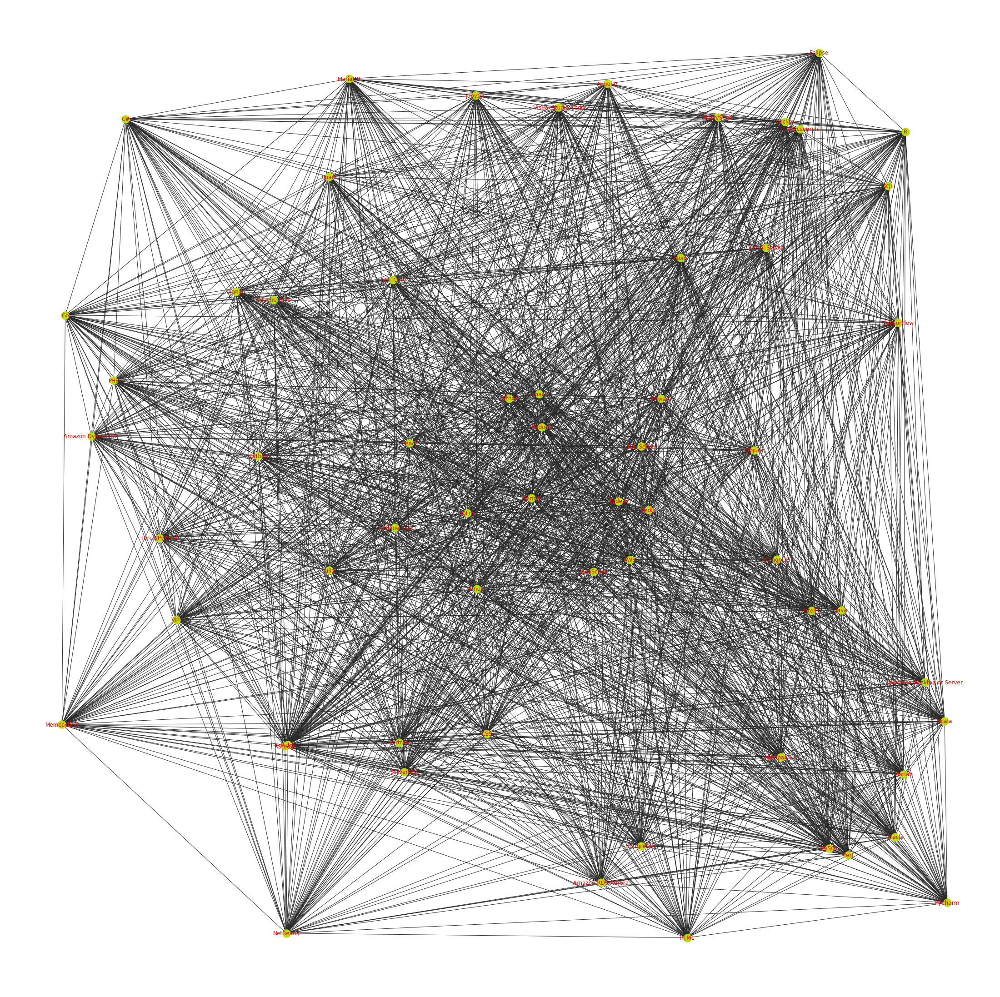

In [174]:
plt.figure(figsize=(30,30))
nx.draw_random(G, with_labels=True, node_color='#B9DD08', edge_color='#2A2A2A', linewidths=1, font_color="red")

In [ ]:
def get_shortest_paths_distances(graph, pairs, edge_weight_name):
    """Compute shortest distance between each pair of nodes in a graph.  Return a dictionary keyed on node pairs (tuples)."""
    distances = {}
    for pair in pairs:
        distances[pair] = nx.dijkstra_path_length(graph, pair[0], pair[1], weight=edge_weight_name)
    return distances

In [ ]:
# Compute shortest paths.  Return a dictionary with node pairs keys and a single value equal to shortest path distance.
odd_node_pairs_shortest_paths = get_shortest_paths_distances(G, edges, 'distance')

In [ ]:
!pip install bokeh

In [ ]:
from bokeh.io import output_notebook, show
output_notebook()

In [ ]:
import bokeh

In [ ]:
from bokeh.models.graphs import from_networkx
from bokeh.models import Range1d, Plot

In [ ]:
from bokeh.models.graphs import NodesAndLinkedEdges
from bokeh.models import Circle, HoverTool, MultiLine

In [ ]:
# We could use figure here but don't want all the axes and titles
plot = Plot(x_range=Range1d(-1.1,1.1), y_range=Range1d(-1.1,1.1))

# Create a Bokeh graph from the NetworkX input using nx.spring_layout
graph = from_networkx(G, nx.spring_layout, scale=2)
plot.renderers.append(graph)

# Set some of the default node glyph (Circle) properties
graph.node_renderer.glyph.update(size=20, fill_color="orange", tags=Unique_languages)

show(plot)

In [ ]:
from bokeh.io import show, output_notebook
from bokeh.plotting import figure
from bokeh.models.graphs import from_networkx
from bokeh.models import Range1d, Plot

# We could use figure here but don't want all the axes and titles
plot = Plot(x_range=Range1d(-1.1,1.1), y_range=Range1d(-1.1,1.1))

# Create a Bokeh graph from the NetworkX input using nx.spring_layout
graph = from_networkx(G, nx.spring_layout, scale=2, center=(0,0))
plot.renderers.append(graph)

# Set some of the default node glyph (Circle) properties
graph.node_renderer.glyph.update(size=20, fill_color="orange")
show(plot)

In [ ]:
graph.node_renderer.glyph = Circle(size=25, fill_color='#2b83ba', tags=Unique_languages)
graph.edge_renderer.glyph = MultiLine(line_color="#cccccc", line_alpha=0.8, line_width=2)

# green hover for both nodes and edges
graph.node_renderer.hover_glyph = Circle(size=25, fill_color='#abdda4')
graph.edge_renderer.hover_glyph = MultiLine(line_color='#abdda4', line_width=4)

# When we hover over nodes, highlight adjecent edges too
graph.inspection_policy = NodesAndLinkedEdges()

plot.add_tools(HoverTool(tooltips=None))

show(plot)

Stuff I was playing about with

In [ ]:
# import math
# from bokeh.io import show, output_file
# from bokeh.plotting import figure
# from bokeh.models import GraphRenderer, StaticLayoutProvider, Oval
# from bokeh.palettes import Spectral8

In [ ]:
#N = languages_results.iloc[:, slice(3,21)]
# N = 8
# node_indices = list(range(N))

# plot = figure(title='Graph Layout Demonstration', x_range=(-1.1,1.1), y_range=(-1.1,1.1),
#               tools='', toolbar_location=None)

# graph = GraphRenderer()

# graph.node_renderer.data_source.add(node_indices, 'index')
# graph.node_renderer.data_source.add(Spectral8, 'color')
# graph.node_renderer.glyph = Oval(height=0.1, width=0.2, fill_color='color')

# graph.edge_renderer.data_source.data = dict(
#     start=[0]*N,
#     end=node_indices)

# ## start of layout code
# circ = [i*2*math.pi/8 for i in node_indices]
# x = [math.cos(i) for i in circ]
# y = [math.sin(i) for i in circ]

# graph_layout = dict(zip(node_indices, zip(x, y)))
# graph.layout_provider = StaticLayoutProvider(graph_layout=graph_layout)

# plot.renderers.append(graph)

# output_file('graph.html')
# show(plot)

In [ ]:
# import networkx as nx

# from bokeh.io import show, output_file
# from bokeh.plotting import figure
# from bokeh.models.graphs import from_networkx

# G=nx.karate_club_graph()

# plot = figure(title="Networkx Integration Demonstration", x_range=(-1.1,1.1), y_range=(-1.1,1.1),
#               tools="", toolbar_location=None)

# graph = from_networkx(G, nx.spring_layout, scale=2, center=(0,0))
# plot.renderers.append(graph)

# output_file("networkx_graph.html")
# show(plot)

In [ ]:
# ldf_for_array = languages_results.iloc[:, slice(2,21)]
# ldf_for_array

In [ ]:
#ldf_for_array.reset_index(level=ldf_for_array["Job Role"])

In [ ]:
#ldf_for_array["Job Role"].unique()

In [ ]:
#ldf_for_array.assign(Count = ldf_for_array.groupby('Job Role').cumcount()).pivot()
#languages_pivoted = ldf_for_array.pivot(index = ['Language'])
#(index=None, columns=['software developer', 'technical lead', 'intern/placement/apprentice', 'hpc support', 'front end developer', 'it practitioner', 'scientific software engineer', 'scientist', 'team leader', 'climate monitor', 'software engineer', 'manager', 'nan', 'technical services and facility management', 'technology architect', 'engineer', 'solutions architect', 'business continuity analyst', 'principal security and information risk advisor'])

In [ ]:
# languages_array = ldf_for_array.values
# languages_array

In [ ]:
#languages_matrix = languages_array.T.dot(languages_array)

In [ ]:
# np.fill_diagonal(languages_matrix, 0)
# languages_matrix

In [ ]:
#np.insert(languages_matrix, obj="slice",values=['Bash/Shell','Python','Go','JavaScript','C#','Clojure','Scala','SQL','HTML','CSS','Julia','Java','R','Ruby','PHP','Matlab','Perl','Fortran'])

In [ ]:
# from sklearn.cluster import KMeans
# from copy import deepcopy
# from matplotlib import pyplot as plt

In [ ]:
# kmeans = KMeans(n_clusters=5)
# kmeans = kmeans.fit(languages_matrix)
# labels = kmeans.predict(languages_matrix)
# centroids = kmeans.cluster_centers_
# centroids

In [ ]:
# x=languages_results["Job Role"].list
# y1=languages_results["Bash/Shell"].list
# y2=languages_results["Python"].values
# y3=languages_results["Go"].values
# y4=languages_results["JavaScript"].values
# y5=languages_results["C#"].values
# y6=languages_results["Clojure"].values
# y7=languages_results["Scala"].values
# y8=languages_results["SQL"].values
# y9=languages_results["HTML"].values
# y10=languages_results["CSS"].values
# y11=languages_results["Julia"].values
# y12=languages_results["Java"].values
# y13=languages_results["R"].values
# y14=languages_results["Ruby"].values
# y15=languages_results["PHP"].values
# y16=languages_results["Matlab"].values
# y17=languages_results["Perl"].values
# y18=languages_results["Fortran"].values

#plt.plot( x, y1, data=languages_results, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
# plt.plot( 'x', 'y2', data=df, marker='', color='olive', linewidth=2)
# plt.plot( 'x', 'y3', data=df, marker='', color='olive', linewidth=2, linestyle='dashed', label="toto")
# plt.legend()

In [ ]:
# x=np.arange(6)

# fig=plt.figure()
# fig.show()
# ax=fig.add_subplot(111)

# ax.plot(x,x,c='b',marker="^",ls='--',label='GNE',fillstyle='none')
# ax.plot(x,x+1,c='g',marker=(8,2,0),ls='--',label='MMR')
# ax.plot(x,(x+1)**2,c='k',ls='-',label='Rand')
# ax.plot(x,(x-1)**2,c='r',marker="v",ls='-',label='GMC')
# ax.plot(x,x**2-1,c='m',marker="o",ls='--',label='BSwap',fillstyle='none')
# ax.plot(x,x-1,c='k',marker="+",ls=':',label='MSD')

# plt.legend(loc=2)
# plt.draw()

In [ ]:
# plt.rcParams['figure.figsize'] = (16, 9)
# plt.style.use('ggplot')

In [ ]:
# f1 = data['V1'].values
# f2 = data['V2'].values
# X = np.array(list(zip(f1, f2)))
# plt.scatter(ldf_for_array, languages_results["Job Role"], c='black', s=7)

In [ ]:
# def column_indexes(df):
#     for question_col in (data.get(col) for col in data.columns):
#         for languages_col in (languages_results.get(col) for col in language_results.columns):
#             if languages_col.name in question_col.name:
#                 return question_col, languages_col
            
# def get_count(df):
#     for question_col in (data.get(col) for col in data.columns):
#         for languages_col in (languages_results.get(col) for col in language_results.columns):
#             if row in question_col.iterrows == "Yes":
#                 if languages_col>=1:
#                     languages_col+1
#                     if row in question_col.iterrows == "Yes":
#                         if languages_col == 0:
#                             languages_col = 1 and languages_results("Job Role") = data("3 : What is your job role within the team?")
#             else:
#                 return False
#     return languages_results

In [ ]:
# def tech_match(df):
#     for q_col in (data.get(col) for col in data.columns):
#         for language_col in (languages_results.get(col) for col in language_results.columns):
#             if language_col("\s\b\I\b\s").name in q_col.name:
#                 return data_col
        
#if text in tech column head with regex of whitespace i whitespace is in text of test data column header - return test col index


In [ ]:
'Bash/Shell','Python','Go','JavaScript','C#','Clojure','Scala','SQL','HTML','CSS','Julia','Java','R','Ruby','PHP','Matlab','Perl','Fortran'